## Load libraries

In [1]:
import yt
import caesar
import numpy as np
import matplotlib.pyplot as plt
import unyt
import json
import pprint
import copy

import os
from glob import glob
from pathlib import Path

# For Swift Emulator training and validation
import swiftemulator as se
from swiftemulator.design import latin
from swiftemulator.io.swift import load_parameter_files
from swiftemulator.emulators import gaussian_process, gaussian_process_bins, gaussian_process_mcmc, gaussian_process_one_dim, linear_model, multi_gaussian_process
from swiftemulator.mean_models.polynomial import PolynomialMeanModel
from swiftemulator.sensitivity import basic, cross_check, cross_check_bins
from swiftemulator.mocking import mock_sweep

# For reading in and checking observational data
import swiftpipeline as sp

from velociraptor.observations import load_observation, load_observations
from swiftemulator.comparison.penalty import L2PenaltyCalculator, GaussianDataErrorsPercentFloorPenaltyCalculator
from swiftemulator.comparison.visualisation import visualise_penalties_mean, visualise_penalties_generic_statistic


# For fitting model to data
from scipy.optimize import minimize

import emcee
import corner
import arviz
from scipy.stats import norm

/home/b/babul/aspadawe/miniconda3/envs/yt_swift_caesar/lib/python3.9/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


## Global plot definitions

In [2]:
X_LABEL = r'$\log(M_{\star}\,/\,M_{\odot})$'
Y_LABEL = r'$\log(\Phi=dn/dlogM_\star\,[\,\mathrm{dex}^{-1}\,\mathrm{cMpc}^{-3}])$'

## Load simulated data (galaxy functions, scaling relations, ...)

In [3]:
snap_prefix = 'model-name'  # eg. 'simba_s12.5n128'
snap_num = 'snapshot-number'  # eg. '0015'
snap_dir = '/path/to/calibration/directory'
obs_name = 'name-of-observable'  # eg. 'gsmf'

In [13]:
snap_prefix = 'simba_s25n256'  # eg. 'simba_s12.5n128'
snap_num = '0015'  # eg. '0015'
snap_dir = '/scratch/b/babul/aspadawe/swift_tests/cali_simba/past_calibrations/swimba_s25n256_ps2020_64x/'
obs_name = 'gsmf'  # eg. 'gsmf'

In [18]:
sim_paths = [Path(x) for x in glob(os.path.join(snap_dir,'cali_*', snap_prefix+'_'+obs_name+'_'+snap_num+'.hdf5')) 
             if os.path.exists(x)]
cali_dirs = [Path(x) for x in glob(os.path.join(snap_dir,'cali_*')) 
             if os.path.exists(os.path.join(x, snap_prefix+'_'+obs_name+'_'+snap_num+'.hdf5'))]
cali_dirnames = {dirname.stem: dirname for dirname in cali_dirs}
cali_list = [dirname.stem for dirname in cali_dirs]

In [15]:
'''
sim_dict = {}

for cali in cali_list:
    sim_file = os.path.join(snap_dir, cali, snap_prefix+'_'+obs_name+'_'+snap_num+'.hdf5')

    # Load simulation observable data, eg. GSMF
    sim_data = load_observations(sim_file)[0]
    logM = np.log10(sim_data.x.value)
    logPhi = np.log10(sim_data.y.value)
    Phi_err = sim_data.y_scatter.value
    logPhi_err = Phi_err/(np.log(10) * 10**logPhi)
    
    X_RANGE = logM
    
    # Sanitize data of -inf, +inf, NaN values
    # Data for different simulations may have different array lengths
    isfinite = np.isfinite(logPhi)
    logM = logM[isfinite]
    logPhi = logPhi[isfinite]
    Phi_err = Phi_err[isfinite]
    logPhi_err = logPhi_err[isfinite]
    
    sim_dict[cali] = {'logM':logM, 'logPhi':logPhi, 'Phi_err':Phi_err, 'logPhi_err':logPhi_err}
'''

/tmp/ipykernel_88577/2896576216.py:9: RuntimeWarning: divide by zero encountered in log10
  logPhi = np.log10(sim_data.y.value)
/tmp/ipykernel_88577/2896576216.py:11: RuntimeWarning: invalid value encountered in divide
  logPhi_err = Phi_err/(np.log(10) * 10**logPhi)


In [19]:
sim_dict = {}

for cali, sim_path in zip(cali_list, sim_paths):
    print(cali)
    sim_file = sim_path
    
    
    try:
        sim_data = load_observations(sim_file)[0]
    except:
        continue

    # Load simulation observable data, eg. GSMF
    logx = np.log10(sim_data.x.value)
    logy = np.log10(sim_data.y.value)
    y_err = sim_data.y_scatter.value
    logy_err = y_err/(np.log(10) * 10**logy) #+ 0.1

    
    # Sanitize data of -inf, +inf, NaN values
    # Data for different simulations may have different array lengths
    isfinite = np.isfinite(logx)
    isfinite_err = np.resize(isfinite, np.shape(y_err))

    logx = logx[isfinite]
    logy = logy[isfinite]

    y_err_copy = y_err[isfinite_err]
    logy_err_copy = logy_err[isfinite_err]

    if (y_err_copy.ndim != y_err.ndim):
        y_err = y_err_copy.reshape(y_err.ndim, -1)
        logy_err = logy_err_copy.reshape(logy_err.ndim, -1)
    else:
        y_err = y_err_copy
        logy_err = logy_err_copy
    

    isfinite = np.isfinite(logy)
    isfinite_err = np.resize(isfinite, np.shape(y_err))

    logx = logx[isfinite]
    logy = logy[isfinite]
    
    y_err_copy = y_err[isfinite_err]
    logy_err_copy = logy_err[isfinite_err]
    
    if (y_err_copy.ndim != y_err.ndim):
        y_err = y_err_copy.reshape(y_err.ndim, -1)
        logy_err = logy_err_copy.reshape(logy_err.ndim, -1)
    else:
        y_err = y_err_copy
        logy_err = logy_err_copy
    
    
    y_err_arr = np.array(y_err)
    logy_err_arr = np.array(logy_err)
    
    if (y_err_arr.ndim!=1):
        mean_y_err = np.nanmean(y_err_arr, axis=0)
        mean_logy_err = np.nanmean(logy_err_arr, axis=0)
    else:
        mean_y_err = y_err_arr
        mean_logy_err = logy_err_arr
    
    
    sim_dict[cali] = {'logx':logx, 'logy':logy,
                      'y_err':y_err, 'mean_y_err':mean_y_err,
                      'logy_err':logy_err, 'mean_logy_err':mean_logy_err}

cali_0037
cali_0018
cali_0002
cali_0044
cali_0036
cali_0030
cali_0000
cali_0004
cali_0047
cali_0046
cali_0062
cali_0059
cali_0019
cali_0007
cali_0055
cali_0015
cali_0039
cali_0003
cali_0050
cali_0012
cali_0022
cali_0009
cali_0056
cali_0029
cali_0026
cali_0049
cali_0035
cali_0054
cali_0016
cali_0057
cali_0043
cali_0045
cali_0041
cali_0011
cali_0040
cali_0017


/tmp/ipykernel_88577/1414516821.py:18: RuntimeWarning: divide by zero encountered in log10
  logy = np.log10(sim_data.y.value)
/tmp/ipykernel_88577/1414516821.py:22: RuntimeWarning: invalid value encountered in divide
  logy_err = y_err/(np.log(10) * 10**logy) #+ 0.1


cali_0042
cali_0008
cali_0061
cali_0063
cali_0033
cali_0023
cali_0060
cali_0038
cali_0053
cali_0032
cali_0010
cali_0021
cali_0034
cali_0052
cali_0031
cali_0025
cali_0024
cali_0058
cali_0013
cali_0005
cali_0051
cali_0027
cali_0028
cali_0048
cali_0001
cali_0020
cali_0006
cali_0014


x:  [ 8.25  8.75  9.25  9.75 10.25 10.75 11.25]
y:  [-1.50652233 -1.34065024 -1.54339369 -1.71402205 -2.12575035 -2.59592274
 -3.55016525]
yerr:  [0.01561039 0.01289668 0.01628732 0.01982274 0.03184402 0.05471596
 0.16414788]


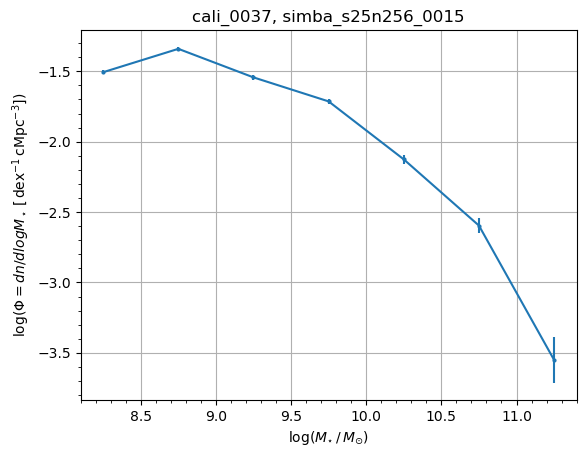

x:  [ 8.25  8.75  9.25  9.75 10.25 10.75 11.25]
y:  [-1.52603157 -1.37242268 -1.4704673  -1.88875826 -2.3996281  -2.87674935
 -4.39526329]
yerr:  [0.01596498 0.01337716 0.01497567 0.02423995 0.04364824 0.07560097
 0.43429448]


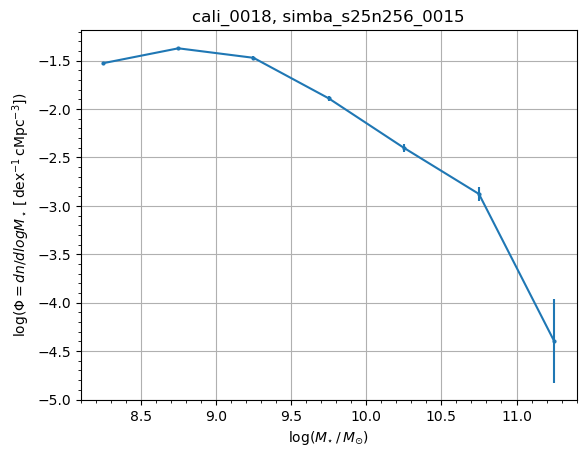

x:  [ 8.25  8.75  9.25  9.75 10.25 10.75]
y:  [-1.89147261 -1.87938945 -1.96389953 -2.34218485 -2.772014   -3.44102078]
yerr:  [0.02431582 0.0239799  0.02643032 0.04085499 0.06701309 0.14476483]


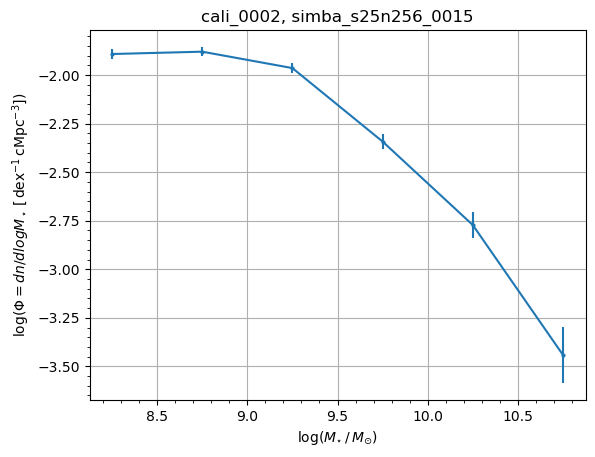

x:  [ 8.25  8.75  9.25  9.75 10.25 10.75 11.25]
y:  [-1.37781256 -1.13758472 -1.29317277 -1.56854077 -2.03165131 -2.6549006
 -3.35387061]
yerr:  [0.01346043 0.0102081  0.01221066 0.01676575 0.02857448 0.05856026
 0.13094471]


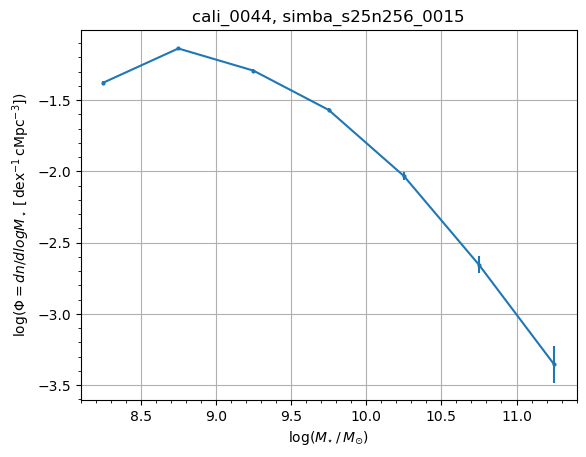

x:  [ 8.25  8.75  9.25  9.75 10.25 10.75]
y:  [-1.87412521 -1.72316543 -1.9559306  -2.36183954 -2.8154797  -3.44102078]
yerr:  [0.02383501 0.02003251 0.02618894 0.04179001 0.07045187 0.14476483]


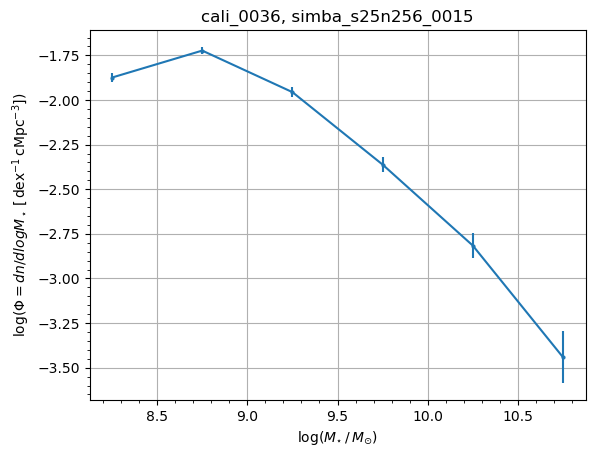

x:  [ 8.25  8.75  9.25  9.75 10.25 10.75]
y:  [-1.91238971 -1.8154797  -1.97365936 -2.36587951 -2.74205078 -3.35387061]
yerr:  [0.0249085  0.02227884 0.02672898 0.04198483 0.0647408  0.13094471]


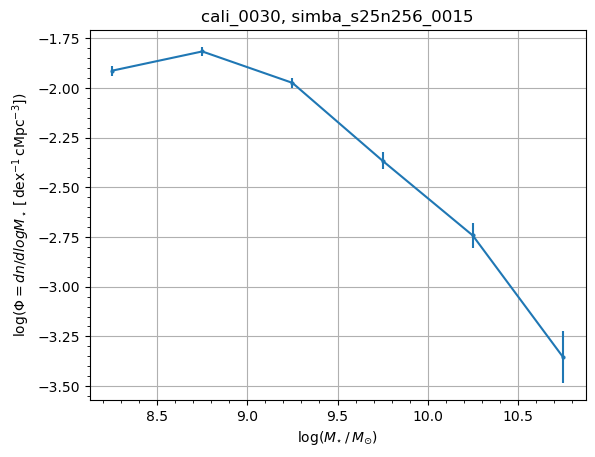

x:  [ 8.25  8.75  9.25  9.75 10.25 10.75 11.25]
y:  [-1.76381952 -1.82823693 -2.10300722 -2.37822995 -2.5379308  -3.03353546
 -4.0942333 ]
yerr:  [0.02099242 0.02260847 0.03102103 0.04258608 0.0511821  0.09055666
 0.30709257]


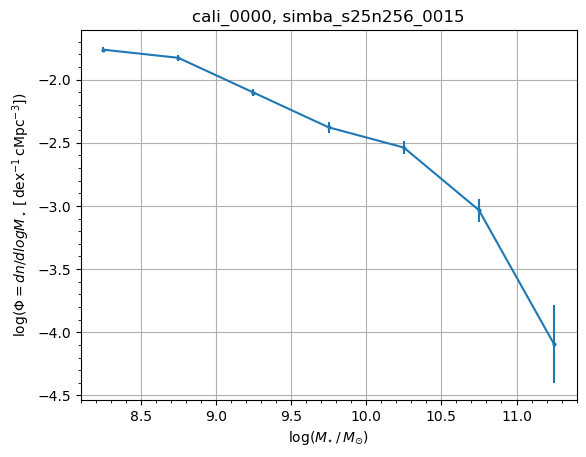

x:  [ 8.25  8.75  9.25  9.75 10.25 10.75]
y:  [-1.93286529 -1.9559306  -2.02604743 -2.21628634 -2.6028716  -3.11650969]
yerr:  [0.02550265 0.02618894 0.02839072 0.03534238 0.05515545 0.09963399]


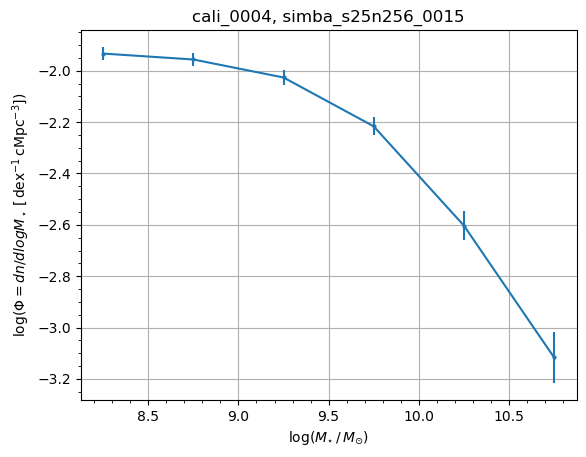

x:  [ 8.25  8.75  9.25  9.75 10.25 10.75 11.25]
y:  [-1.60147291 -1.21743832 -1.19005893 -1.51387864 -2.19114331 -2.74205078
 -4.0942333 ]
yerr:  [0.01741362 0.01119108 0.01084382 0.01574316 0.03433399 0.0647408
 0.30709257]


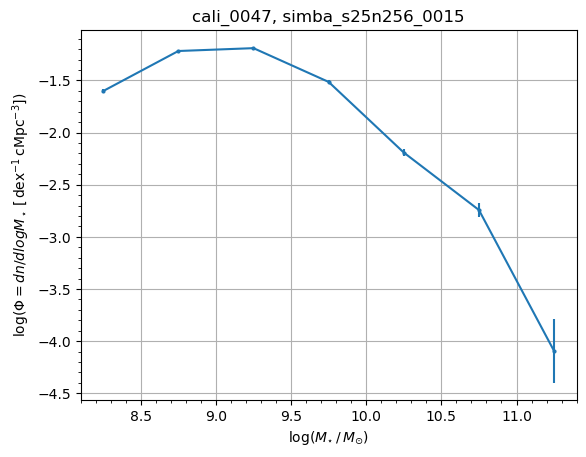

x:  [ 8.25  8.75  9.25  9.75 10.25 10.75 11.25]
y:  [-1.89971895 -1.93436545 -2.15721719 -2.27141165 -2.46076484 -2.76179484
 -3.28131994]
yerr:  [0.02454778 0.02554673 0.0330188  0.03765811 0.04683118 0.06622929
 0.12045162]


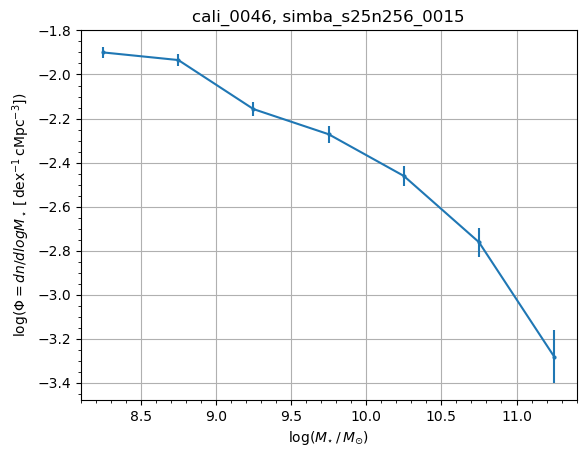

x:  [ 8.25  8.75  9.25  9.75 10.25 10.75 11.25]
y:  [-1.83297043 -1.82823693 -2.13999079 -2.31608205 -2.4976362  -2.772014
 -3.61711204]
yerr:  [0.02273201 0.02260847 0.0323704  0.03964548 0.04886195 0.06701309
 0.17729998]


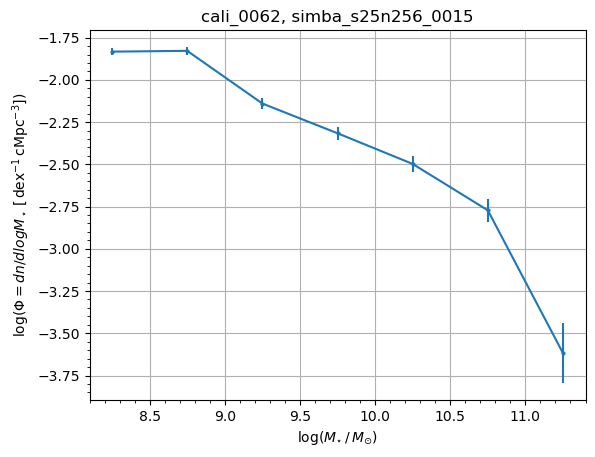

x:  [ 8.25  8.75  9.25  9.75 10.25 10.75 11.25]
y:  [-1.87806739 -1.84626003 -2.11422992 -2.24913526 -2.4362219  -2.83896079
 -3.7932033 ]
yerr:  [0.02394343 0.02308249 0.03142445 0.03670458 0.04552643 0.07238241
 0.21714724]


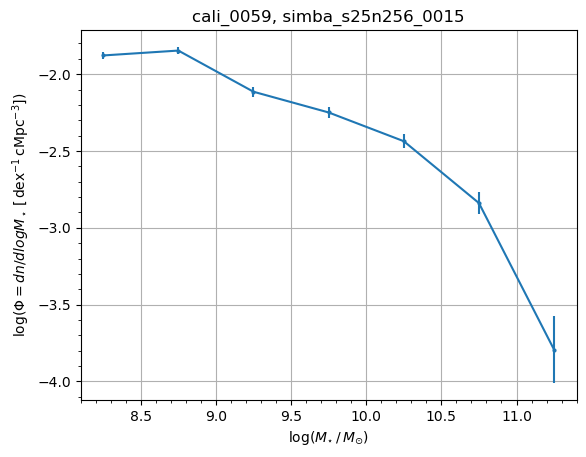

x:  [ 8.25  8.75  9.25  9.75 10.25 10.75 11.25]
y:  [-1.39656813 -1.2157115  -1.37366058 -1.84016884 -2.23091044 -2.76179484
 -3.91814204]
yerr:  [0.01375424 0.01116885 0.01339624 0.02292119 0.03594247 0.06622929
 0.25074004]


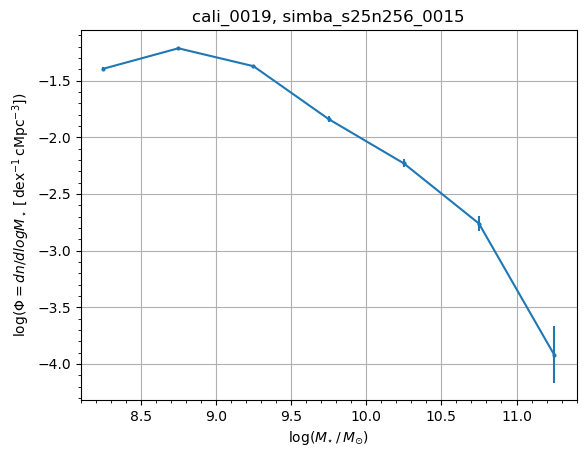

x:  [ 8.25  8.75  9.25  9.75 10.25 10.75 11.25]
y:  [-1.9313703  -1.95751273 -2.10300722 -2.18574828 -2.50877257 -2.9039016
 -3.91814204]
yerr:  [0.02545879 0.02623669 0.03102103 0.0341214  0.04949245 0.07800159
 0.25074004]


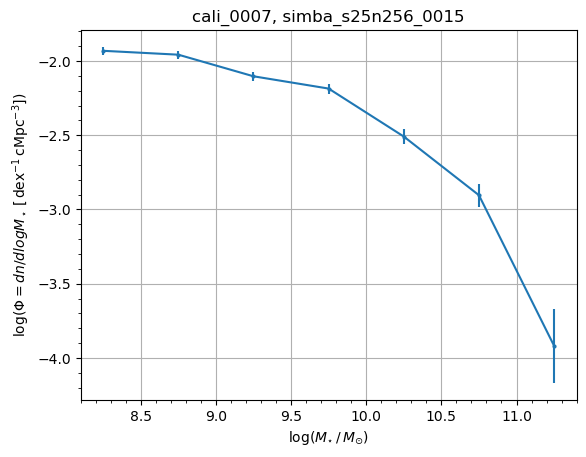

x:  [ 8.25  8.75  9.25  9.75 10.25 10.75]
y:  [-1.6156668  -1.49108892 -1.70506721 -2.23091044 -2.74205078 -3.21917203]
yerr:  [0.01770052 0.01533547 0.01961942 0.03594247 0.0647408  0.11213435]


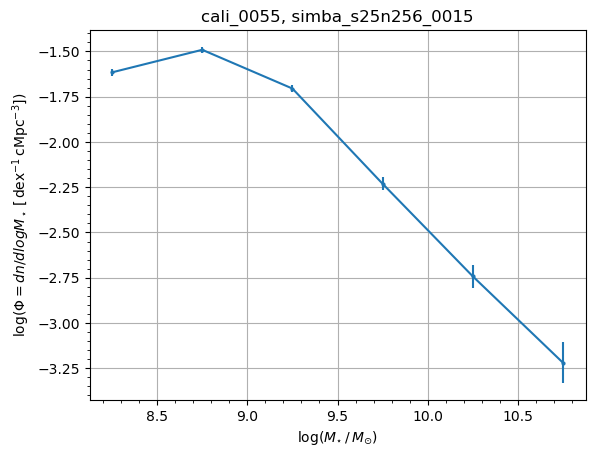

x:  [ 8.25  8.75  9.25  9.75 10.25 10.75 11.25 11.75]
y:  [-1.36103603 -1.19496011 -1.43336782 -1.60851187 -2.05284061 -2.4362219
 -3.21917203 -4.39526329]
yerr:  [0.01320294 0.01090518 0.01434949 0.01755531 0.02928013 0.04552643
 0.11213435 0.43429448]


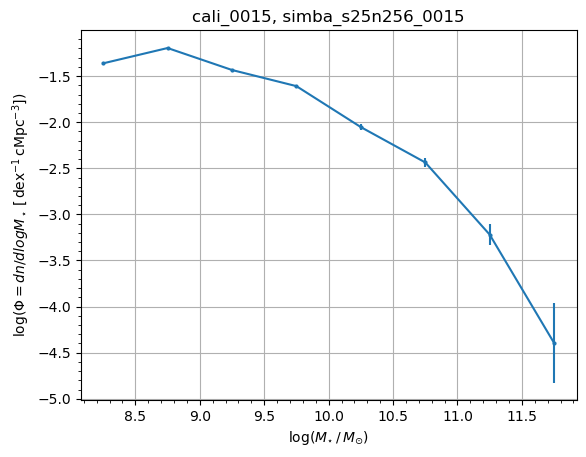

x:  [ 8.25  8.75  9.25  9.75 10.25 10.75 11.25]
y:  [-1.62367581 -1.48250999 -1.62588597 -1.95751273 -2.44102078 -2.9039016
 -4.39526329]
yerr:  [0.01786449 0.01518475 0.01791    0.02623669 0.04577866 0.07800159
 0.43429448]


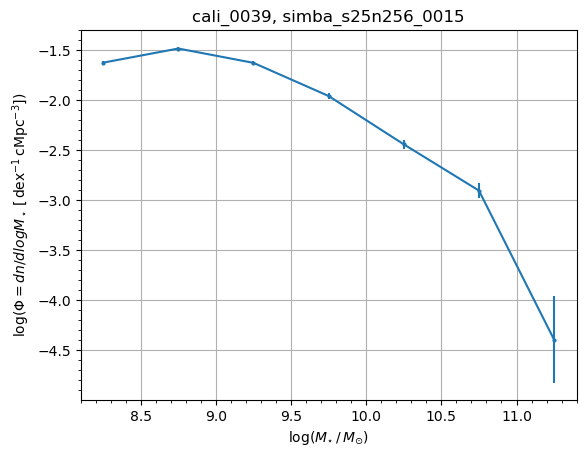

x:  [ 8.25  8.75  9.25  9.75 10.25 10.75]
y:  [-1.77408701 -1.74885957 -1.95751273 -2.38242607 -2.7932033  -3.61711204]
yerr:  [0.02124204 0.02063395 0.02623669 0.04279231 0.06866799 0.17729998]


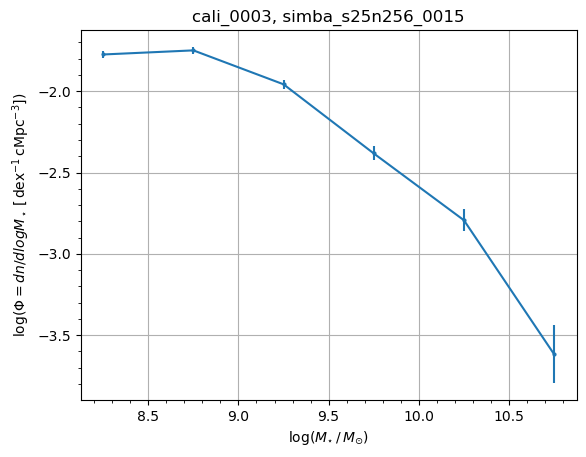

x:  [ 8.25  8.75  9.25  9.75 10.25 10.75 11.25]
y:  [-1.80087074 -1.78247944 -1.95910064 -2.21628634 -2.68769312 -3.16481437
 -4.39526329]
yerr:  [0.02190726 0.02144828 0.0262847  0.03534238 0.06081339 0.10533188
 0.43429448]


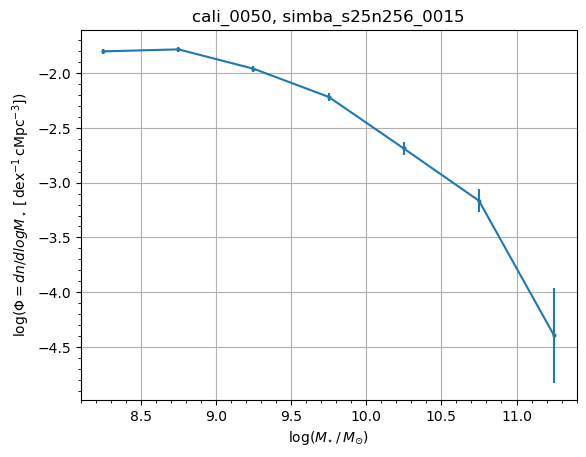

x:  [ 8.25  8.75  9.25  9.75 10.25 10.75 11.25]
y:  [-1.57374976 -1.43957554 -1.50150153 -1.94965909 -2.46076484 -3.01505205
 -4.39526329]
yerr:  [0.0168666  0.01445242 0.01552042 0.02600053 0.04683118 0.08864999
 0.43429448]


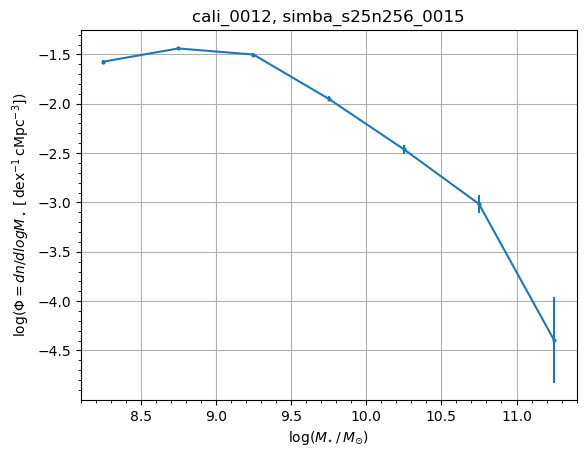

x:  [ 8.25  8.75  9.25  9.75 10.25 10.75 11.25 11.75]
y:  [-1.35943347 -1.13758472 -1.37656279 -1.60427482 -1.87674935 -2.33456545
 -2.89011331 -4.39526329]
yerr:  [0.0131786  0.0102081  0.01344108 0.01746989 0.02390712 0.04049817
 0.07677314 0.43429448]


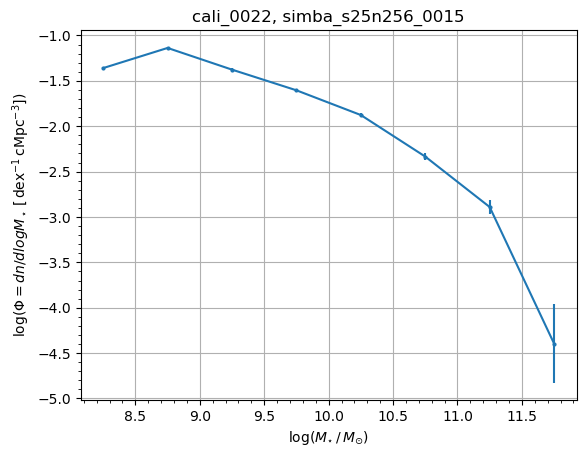

x:  [ 8.25  8.75  9.25  9.75 10.25 10.75 11.25 11.75]
y:  [-1.90530481 -1.93286529 -2.15721719 -2.28467358 -2.41299206 -2.73250546
 -3.39526329 -4.39526329]
yerr:  [0.02470615 0.02550265 0.0330188  0.0382375  0.04432499 0.06403323
 0.13733597 0.43429448]


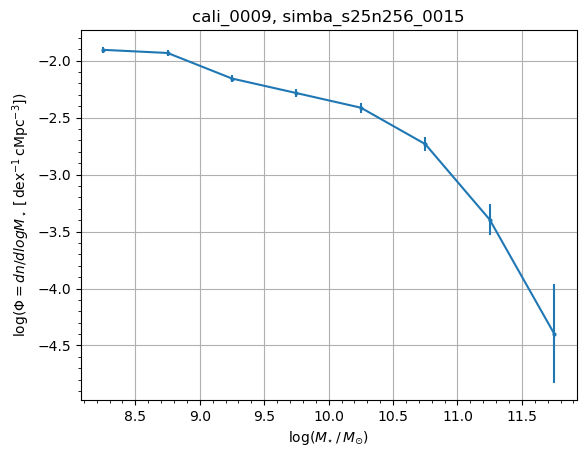

x:  [ 8.25  8.75  9.25  9.75 10.25 10.75 11.25]
y:  [-1.46789293 -1.30571141 -1.43669941 -1.90530481 -2.3308053  -2.71402205
 -4.0942333 ]
yerr:  [0.01493135 0.0123882  0.01440464 0.02470615 0.04032323 0.06268501
 0.30709257]


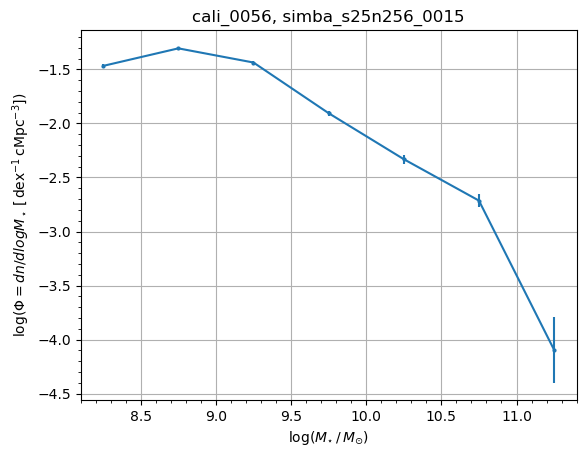

x:  [ 8.25  8.75  9.25  9.75 10.25 10.75 11.25]
y:  [-1.89283617 -1.88875826 -2.12809156 -2.20213869 -2.48144944 -2.83896079
 -3.69629329]
yerr:  [0.02435403 0.02423995 0.03192997 0.03477139 0.0479598  0.07238241
 0.1942224 ]


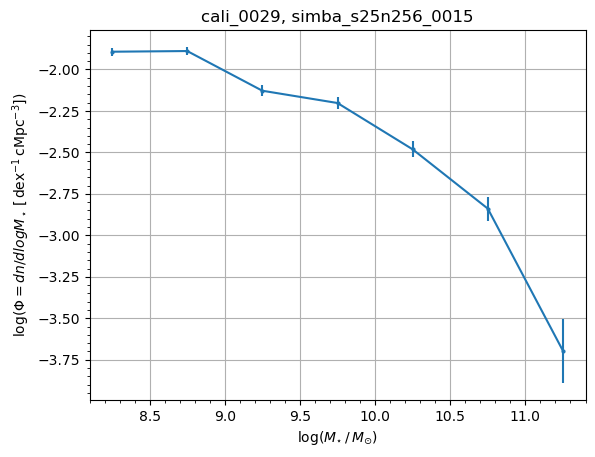

x:  [ 8.25  8.75  9.25  9.75 10.25 10.75]
y:  [-1.89833364 -1.85493382 -2.06484952 -2.43147546 -2.83896079 -3.35387061]
yerr:  [0.02450866 0.02331415 0.02968776 0.04527833 0.07238241 0.13094471]


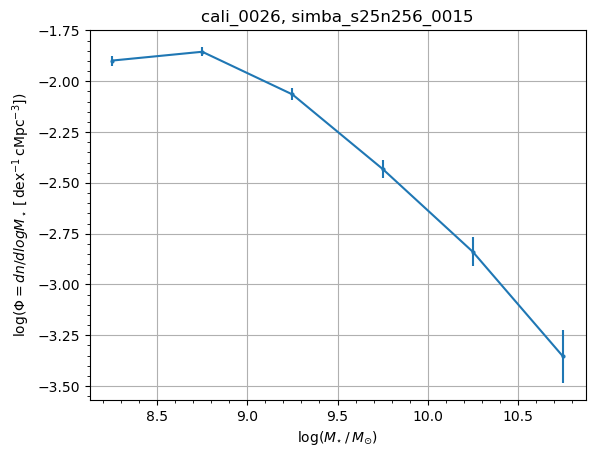

x:  [ 8.25  8.75  9.25  9.75 10.25 10.75 11.25]
y:  [-1.58435901 -1.60638818 -1.82823693 -2.08776725 -2.3308053  -2.72316543
 -3.44102078]
yerr:  [0.01707388 0.01751244 0.02260847 0.0304815  0.04032323 0.06334836
 0.14476483]


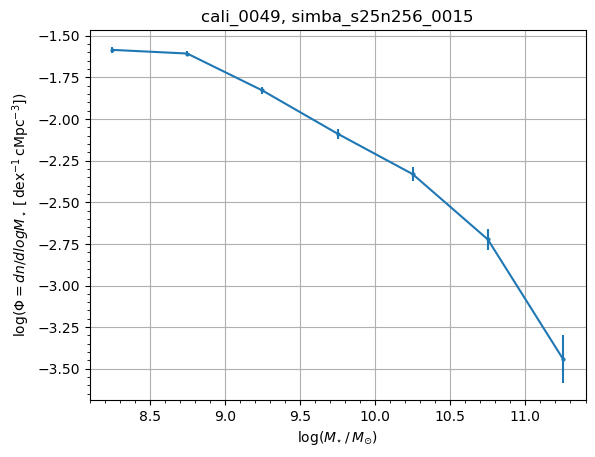

x:  [ 8.25  8.75  9.25  9.75 10.25 10.75]
y:  [-1.85368405 -1.94347686 -2.04115485 -2.36183954 -2.772014   -3.24913526]
yerr:  [0.02328063 0.02581613 0.02888884 0.04179001 0.06701309 0.11607008]


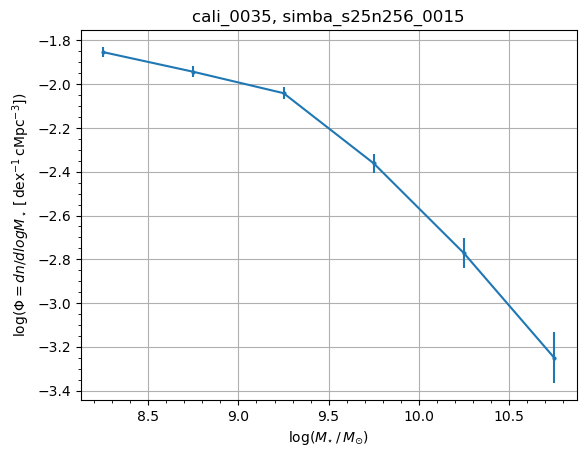

x:  [ 8.25  8.75  9.25  9.75 10.25 10.75 11.25]
y:  [-1.50877257 -1.34141686 -1.39918964 -1.67098742 -2.34994031 -2.83896079
 -4.0942333 ]
yerr:  [0.01565089 0.01290806 0.01379582 0.01886455 0.04122141 0.07238241
 0.30709257]


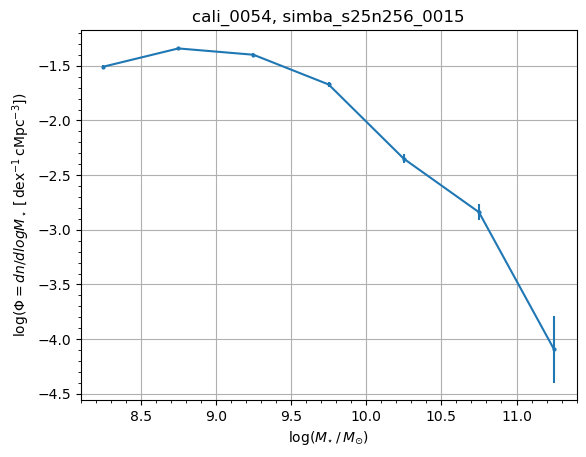

x:  [ 8.25  8.75  9.25  9.75 10.25 10.75 11.25 11.75]
y:  [-1.84995618 -1.82941547 -2.08563312 -2.19114331 -2.42213544 -2.7932033
 -3.28131994 -4.39526329]
yerr:  [0.02318092 0.02263916 0.0304067  0.03433399 0.04479406 0.06866799
 0.12045162 0.43429448]


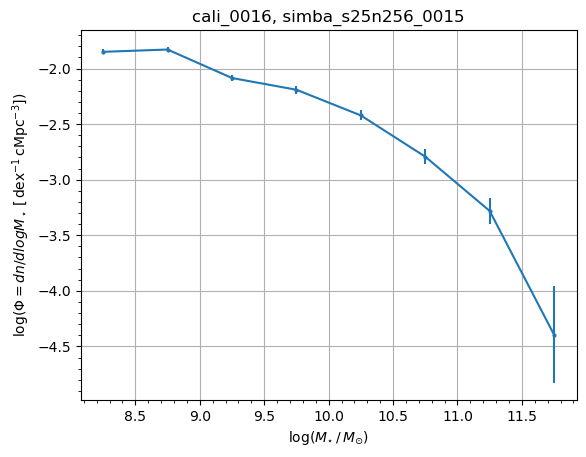

x:  [ 8.25  8.75  9.25  9.75 10.25 10.75]
y:  [-1.91382066 -1.91238971 -2.02977531 -2.37407399 -2.73250546 -3.19114331]
yerr:  [0.02494957 0.0249085  0.02851283 0.0423828  0.06403323 0.10857362]


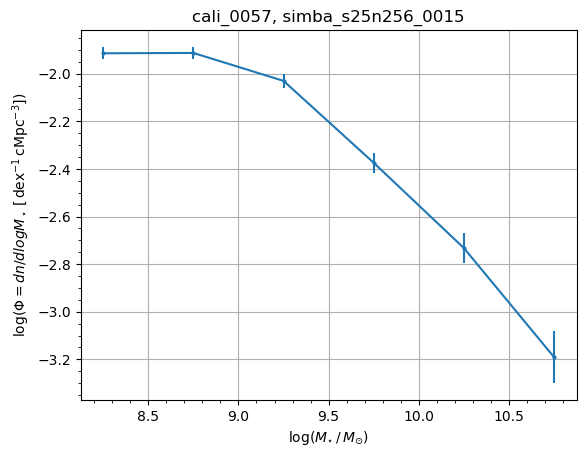

x:  [ 8.25  8.75  9.25  9.75 10.25 10.75]
y:  [-1.7587754  -1.65253816 -1.87674935 -2.3996281  -2.83896079 -3.7932033 ]
yerr:  [0.02087086 0.01846808 0.02390712 0.04364824 0.07238241 0.21714724]


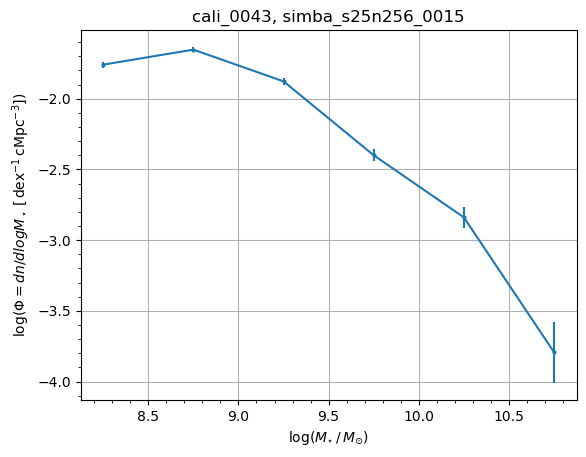

x:  [ 8.25  8.75  9.25  9.75 10.25 10.75 11.25]
y:  [-1.79756811 -1.78142147 -1.96551101 -2.24297495 -2.5379308  -2.98028994
 -4.39526329]
yerr:  [0.02182412 0.02142217 0.0264794  0.03644518 0.0511821  0.08517216
 0.43429448]


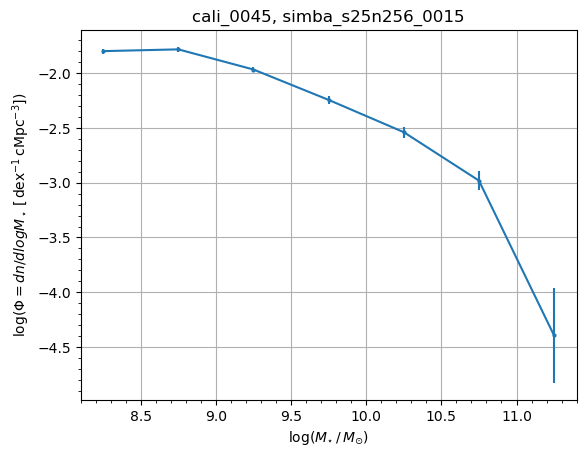

x:  [ 8.25  8.75  9.25  9.75 10.25 10.75 11.25 11.75 12.25]
y:  [-1.59799575 -1.1404736  -1.14289578 -1.40938793 -1.66690951 -1.94501418
 -2.67925995 -3.35387061 -4.39526329]
yerr:  [0.01734405 0.01024211 0.01027071 0.01395875 0.01877619 0.02586186
 0.06022581 0.13094471 0.43429448]


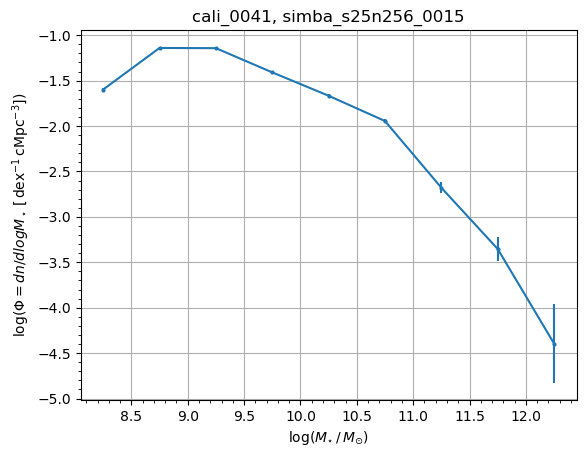

x:  [ 8.25  8.75  9.25  9.75 10.25 10.75 11.25]
y:  [-1.7587754  -1.86250891 -2.19114331 -2.39094192 -2.57571936 -2.86378437
 -3.44102078]
yerr:  [0.02087086 0.02351836 0.03433399 0.04321392 0.05345796 0.07448089
 0.14476483]


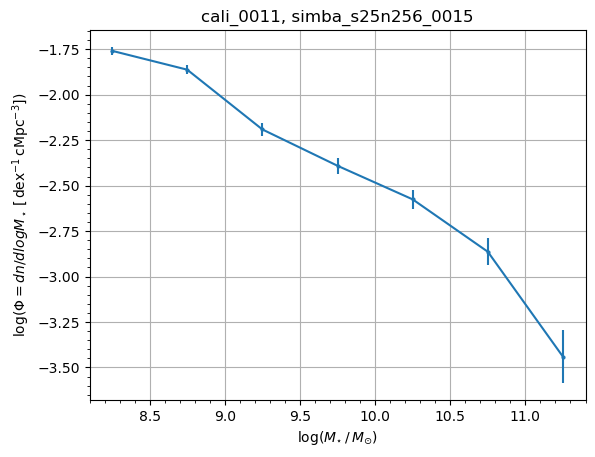

x:  [ 8.25  8.75  9.25  9.75 10.25 10.75]
y:  [-1.73916509 -1.67016877 -1.80755233 -2.2134197  -2.73250546 -3.11650969]
yerr:  [0.02040493 0.01884678 0.02207643 0.03522593 0.06403323 0.09963399]


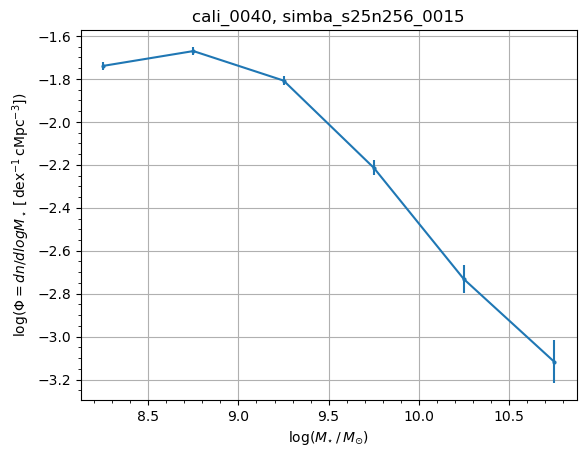

x:  [ 8.25  8.75  9.25  9.75 10.25 10.75 11.25]
y:  [-1.58976243 -1.48357313 -1.66690951 -1.9039016  -2.17777935 -2.63938844
 -3.39526329]
yerr:  [0.01718042 0.01520335 0.01877619 0.02466627 0.03380978 0.05752371
 0.13733597]


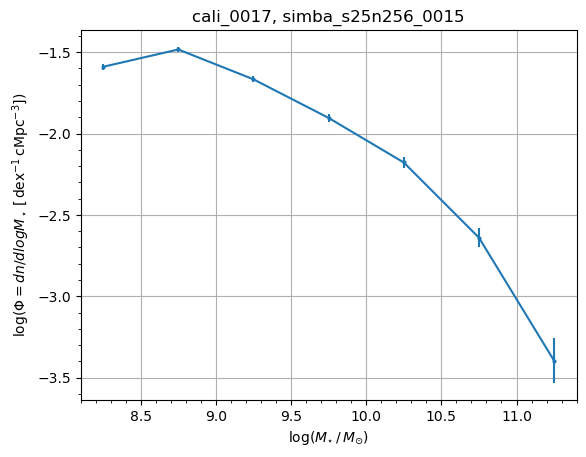

x:  [ 8.25  8.75  9.25  9.75 10.25 10.75 11.25]
y:  [-1.92397158 -1.92988044 -2.1328122  -2.22207702 -2.4362219  -2.83896079
 -3.44102078]
yerr:  [0.02524285 0.02541516 0.03210397 0.03557879 0.04552643 0.07238241
 0.14476483]


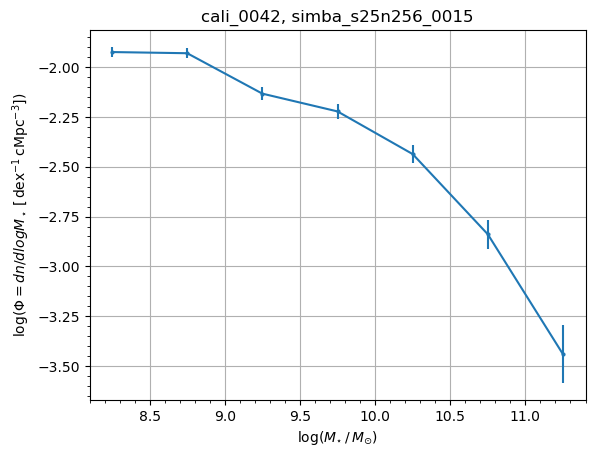

x:  [ 8.25  8.75  9.25  9.75 10.25 10.75 11.25]
y:  [-1.5640336  -1.43006159 -1.59454621 -1.80197722 -2.28131994 -2.83896079
 -4.0942333 ]
yerr:  [0.01667898 0.01429498 0.01727531 0.02193518 0.03809015 0.07238241
 0.30709257]


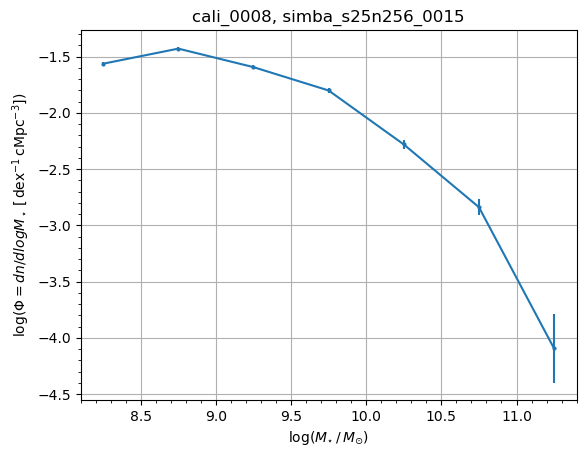

x:  [ 8.25  8.75  9.25  9.75 10.25 10.75 11.25]
y:  [-1.6156668  -1.55016525 -1.76789744 -2.02790737 -2.38242607 -2.7932033
 -4.0942333 ]
yerr:  [0.01770052 0.01641479 0.0210912  0.02845158 0.04279231 0.06866799
 0.30709257]


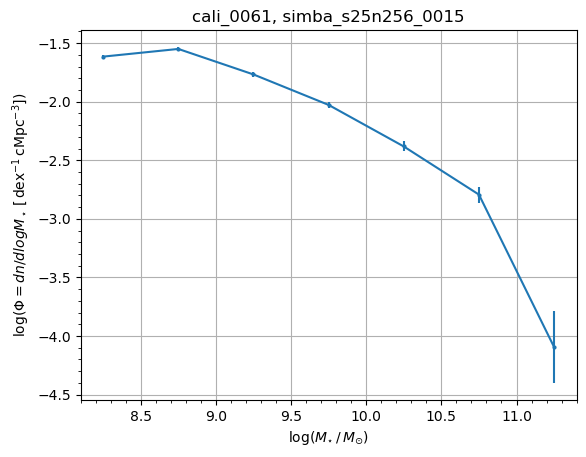

x:  [ 8.25  8.75  9.25  9.75 10.25 10.75 11.25 11.75]
y:  [-1.52603157 -1.37781256 -1.60568258 -1.90530481 -2.15471404 -2.39094192
 -2.72316543 -3.7932033 ]
yerr:  [0.01596498 0.01346043 0.01749822 0.02470615 0.03292378 0.04321392
 0.06334836 0.21714724]


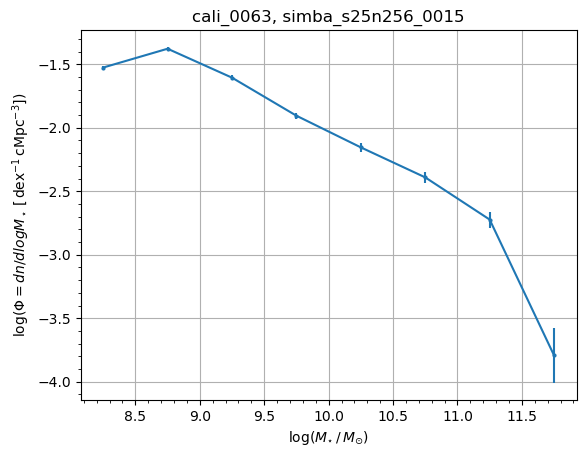

x:  [ 8.25  8.75  9.25  9.75 10.25 10.75]
y:  [-1.56084259 -1.29454821 -1.30219199 -1.86634659 -2.48144944 -3.073044  ]
yerr:  [0.01661782 0.01223001 0.01233811 0.02362251 0.0479598  0.09477083]


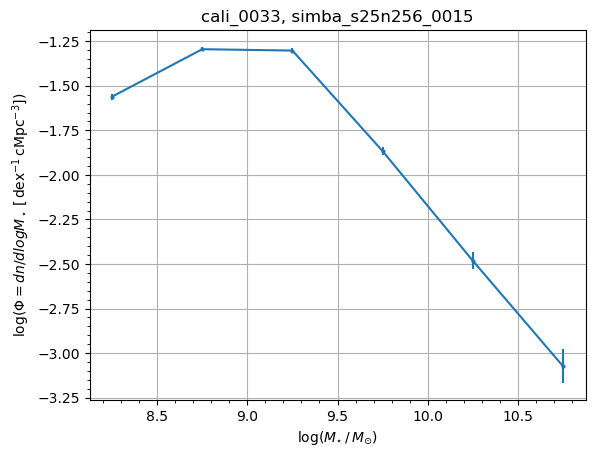

x:  [ 8.25  8.75  9.25  9.75 10.25 10.75 11.25]
y:  [-1.58368829 -1.51330832 -1.70773433 -1.9559306  -2.1966062  -2.64707526
 -3.44102078]
yerr:  [0.0170607  0.01573283 0.01967976 0.02618894 0.03455061 0.05803504
 0.14476483]


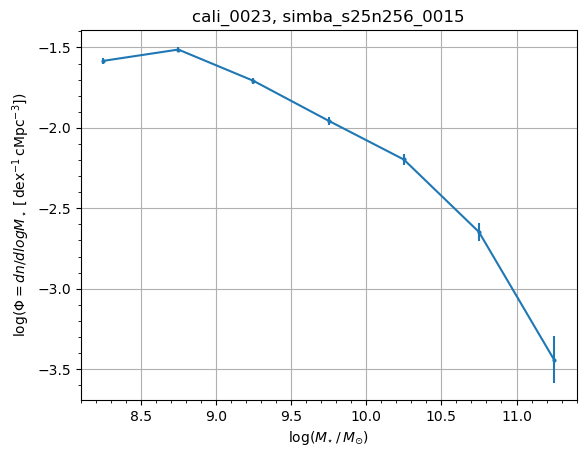

x:  [ 8.25  8.75  9.25  9.75 10.25 10.75 11.25]
y:  [-1.58637742 -1.38623755 -1.57769792 -1.70153634 -2.20213869 -2.72316543
 -3.61711204]
yerr:  [0.0171136  0.01359163 0.01694344 0.01953983 0.03477139 0.06334836
 0.17729998]


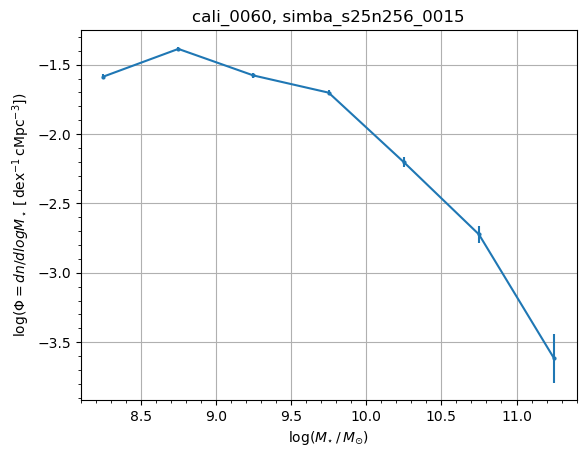

x:  [ 8.25  8.75  9.25  9.75 10.25 10.75 11.25 11.75]
y:  [-1.34954923 -1.1215677  -1.37283492 -1.63333545 -1.96875203 -2.17254682
 -2.59592274 -3.28131994]
yerr:  [0.01302949 0.01002159 0.01338351 0.01806427 0.02657839 0.03360672
 0.05471596 0.12045162]


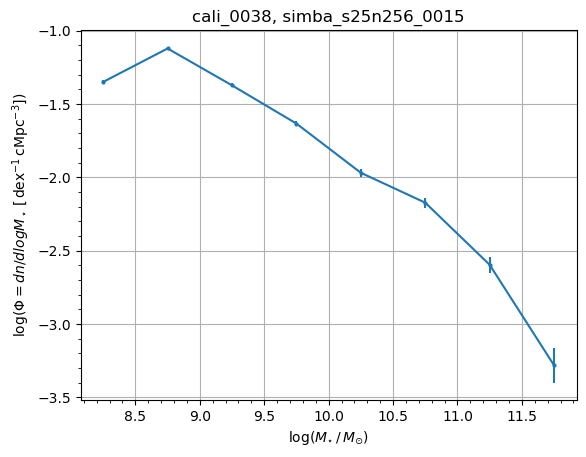

x:  [ 8.25  8.75  9.25  9.75 10.25 10.75]
y:  [-1.66935166 -1.69978162 -1.9512185  -2.4362219  -2.91814204 -3.69629329]
yerr:  [0.01882905 0.0195004  0.02604725 0.04552643 0.07929096 0.1942224 ]


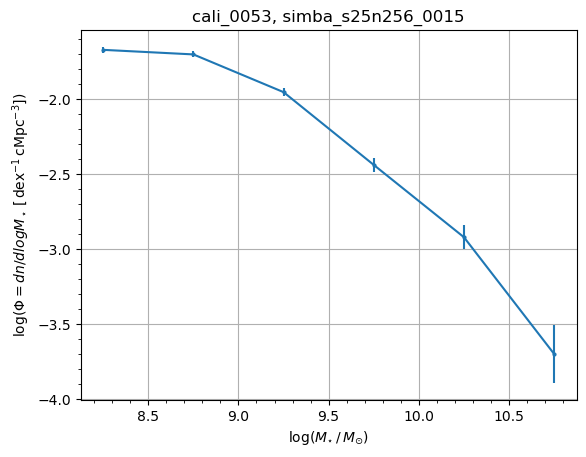

x:  [ 8.25  8.75  9.25  9.75 10.25 10.75]
y:  [-1.73250546 -1.6660985  -1.85870485 -2.38666312 -2.93286529 -3.91814204]
yerr:  [0.02024908 0.01875866 0.02341559 0.04300156 0.08064646 0.25074004]


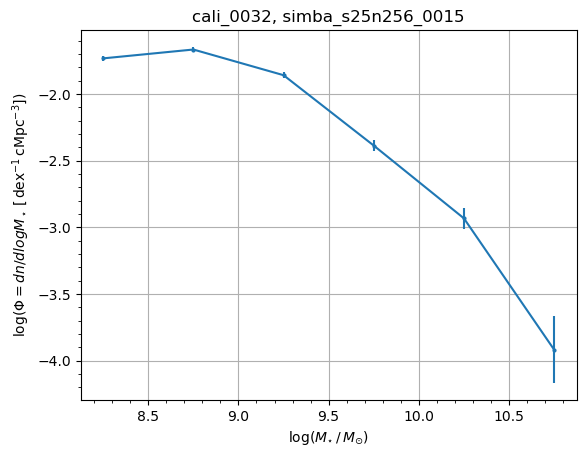

x:  [ 8.25  8.75  9.25  9.75 10.25 10.75 11.25]
y:  [-1.45724419 -1.23841139 -1.31140249 -1.83416191 -2.28131994 -2.86378437
 -4.39526329]
yerr:  [0.01474941 0.01146459 0.01246964 0.02276322 0.03809015 0.07448089
 0.43429448]


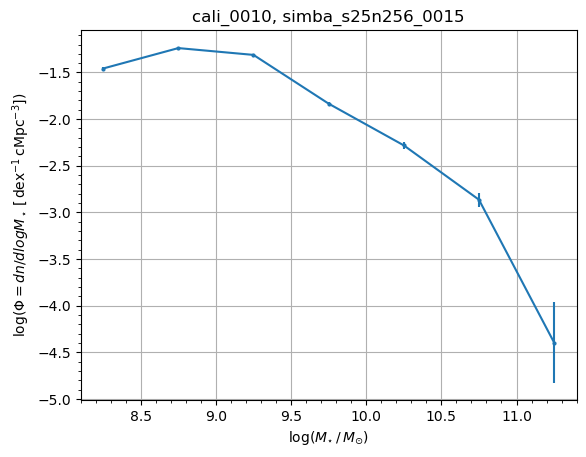

x:  [ 8.25  8.75  9.25  9.75 10.25 10.75]
y:  [-1.6363514  -1.43861471 -1.68769312 -2.30535818 -2.74205078 -3.44102078]
yerr:  [0.0181271  0.01443644 0.01923088 0.03915901 0.0647408  0.14476483]


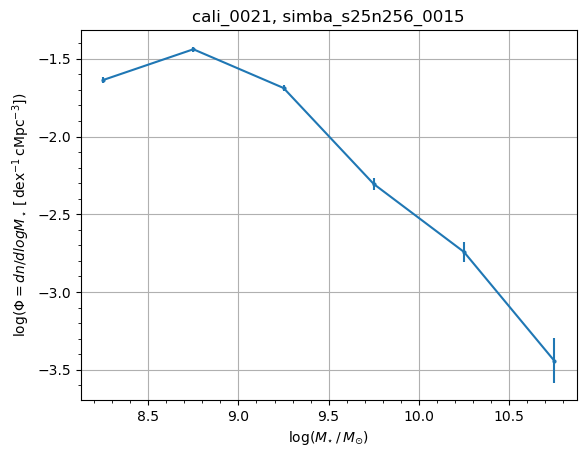

x:  [ 8.25  8.75  9.25  9.75 10.25 10.75]
y:  [-1.72687738 -1.73629845 -1.97038166 -2.31608205 -2.772014   -3.21917203]
yerr:  [0.0201183  0.0203377  0.0266283  0.03964548 0.06701309 0.11213435]


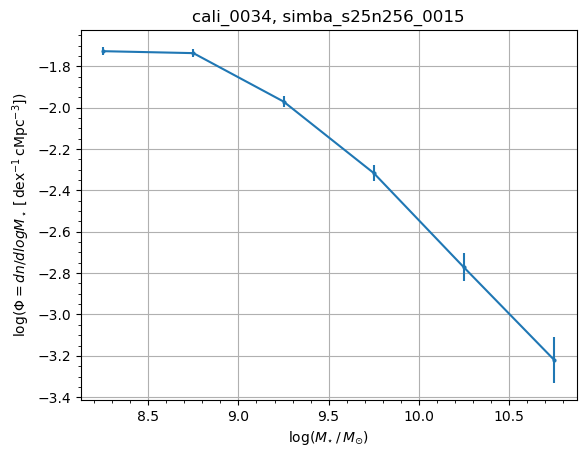

x:  [ 8.25  8.75  9.25  9.75 10.25 10.75]
y:  [-1.82123202 -1.89147261 -2.02051495 -2.34604527 -2.72316543 -3.39526329]
yerr:  [0.02242687 0.02431582 0.02821046 0.04103697 0.06334836 0.13733597]


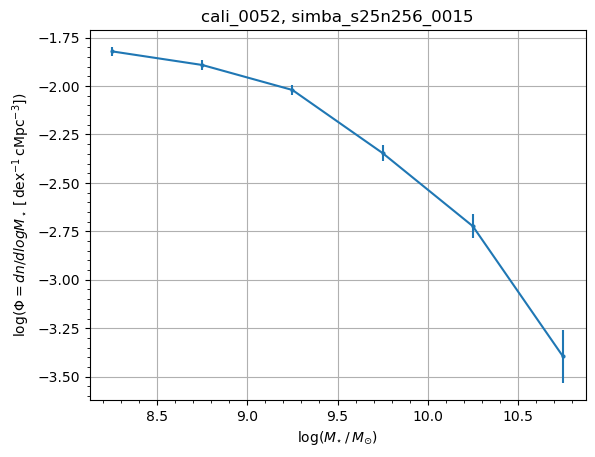

x:  [ 8.25  8.75  9.25  9.75 10.25 10.75 11.25]
y:  [-1.69629329 -1.63559545 -1.86892401 -2.06282483 -2.43147546 -2.85119525
 -4.0942333 ]
yerr:  [0.01942224 0.01811133 0.02369271 0.02961864 0.04527833 0.07340917
 0.30709257]


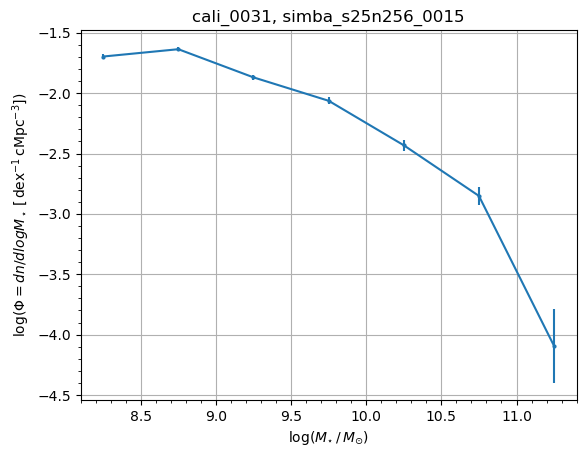

x:  [ 8.25  8.75  9.25  9.75 10.25 10.75]
y:  [-1.63108716 -1.59868896 -1.65807065 -2.21628634 -2.73250546 -3.35387061]
yerr:  [0.01801757 0.0173579  0.01858609 0.03534238 0.06403323 0.13094471]


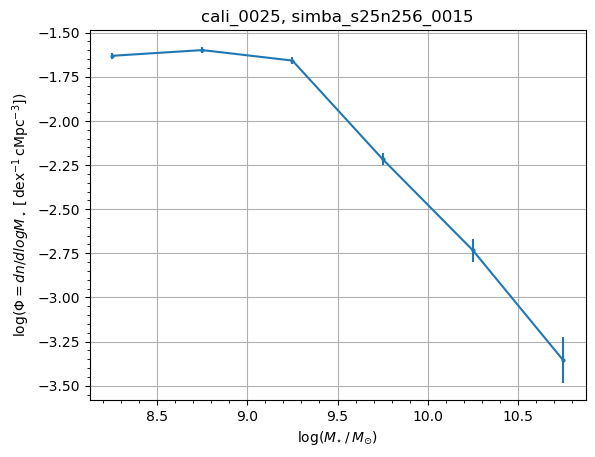

x:  [ 8.25  8.75  9.25  9.75 10.25 10.75 11.25]
y:  [-1.7772152  -1.74398528 -1.88875826 -2.28131994 -2.75181062 -3.21917203
 -4.39526329]
yerr:  [0.02131868 0.02051849 0.02423995 0.03809015 0.06547236 0.11213435
 0.43429448]


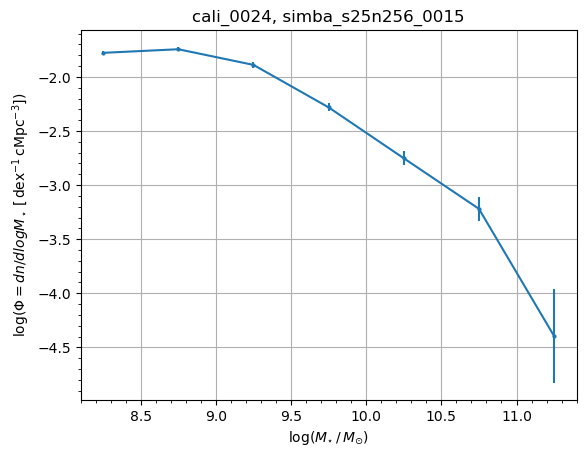

x:  [ 8.25  8.75  9.25  9.75 10.25 10.75]
y:  [-1.90671258 -1.88204569 -1.99386275 -2.39526329 -2.87674935 -3.7932033 ]
yerr:  [0.02474622 0.02405335 0.02735798 0.04342945 0.07560097 0.21714724]


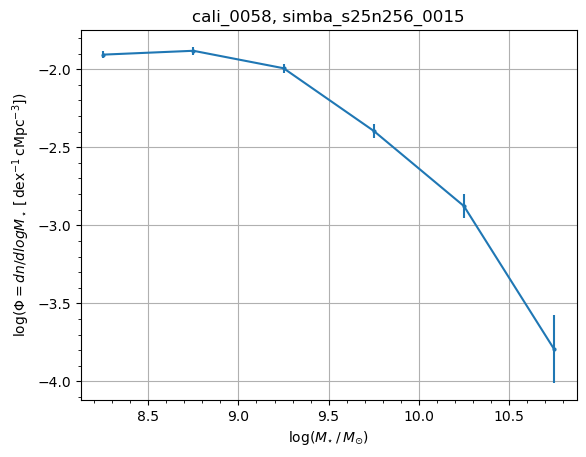

x:  [ 8.25  8.75  9.25  9.75 10.25 10.75 11.25]
y:  [-1.73345061 -1.6660985  -1.87412521 -2.15222524 -2.50877257 -3.073044
 -4.39526329]
yerr:  [0.02027113 0.01875866 0.02383501 0.03282958 0.04949245 0.09477083
 0.43429448]


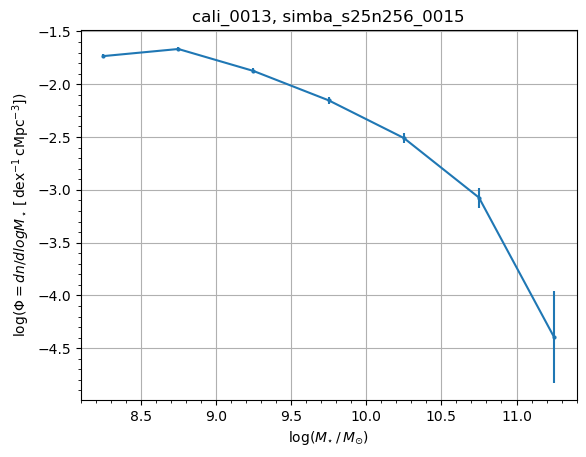

x:  [ 8.25  8.75  9.25  9.75 10.25 10.75]
y:  [-1.87021848 -1.82706157 -2.07098084 -2.48144944 -2.89011331 -3.91814204]
yerr:  [0.02372804 0.0225779  0.02989807 0.0479598  0.07677314 0.25074004]


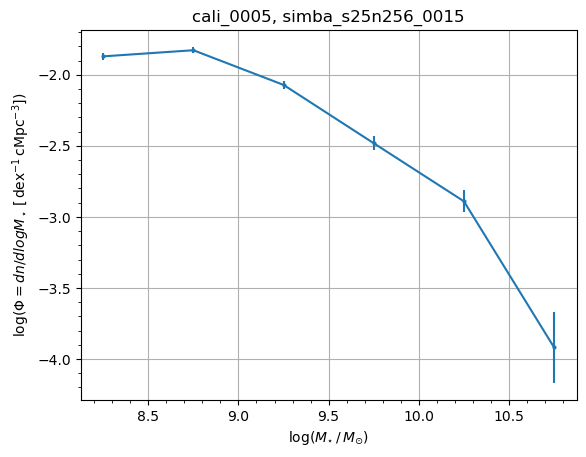

x:  [ 8.25  8.75  9.25  9.75 10.25 10.75 11.25]
y:  [-1.71131616 -1.68009593 -1.89833364 -2.15721719 -2.42678034 -2.93286529
 -4.39526329]
yerr:  [0.01976108 0.01906341 0.02450866 0.0330188  0.04503424 0.08064646
 0.43429448]


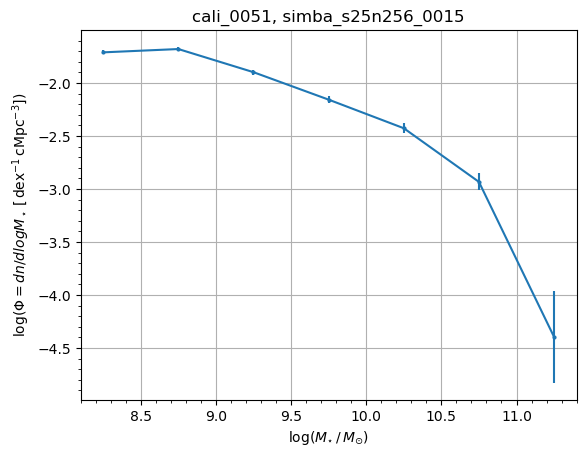

x:  [ 8.25  8.75  9.25  9.75 10.25 10.75 11.25]
y:  [-1.4976362  -1.20633481 -1.27304741 -1.625148   -2.23992725 -2.82706157
 -4.39526329]
yerr:  [0.0154515  0.01104893 0.01193099 0.01789479 0.03631753 0.07139757
 0.43429448]


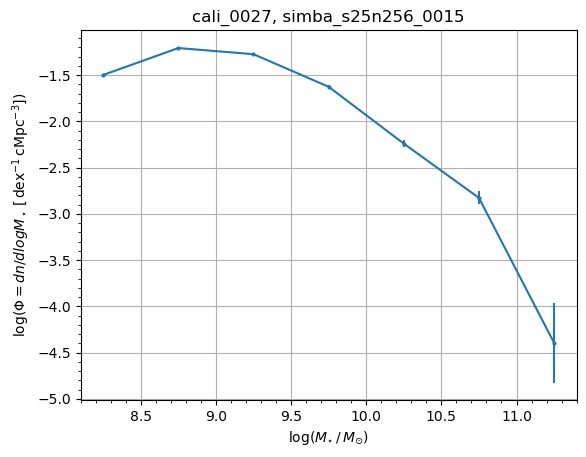

x:  [ 8.25  8.75  9.25  9.75 10.25 10.75 11.25]
y:  [-1.6549006  -1.59799575 -1.80531369 -2.02235129 -2.50877257 -2.85119525
 -4.39526329]
yerr:  [0.01851838 0.01734405 0.0220196  0.02827016 0.04949245 0.07340917
 0.43429448]


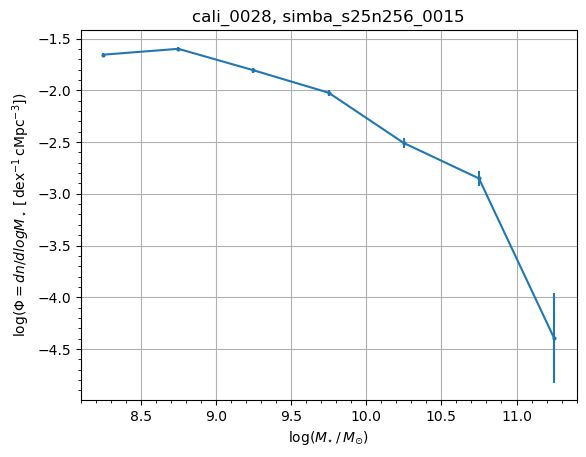

x:  [ 8.25  8.75  9.25  9.75 10.25 10.75 11.25]
y:  [-1.79103724 -1.87806739 -2.14975062 -2.37822995 -2.4921733  -2.82706157
 -3.61711204]
yerr:  [0.02166064 0.02394343 0.03273618 0.04258608 0.0485556  0.07139757
 0.17729998]


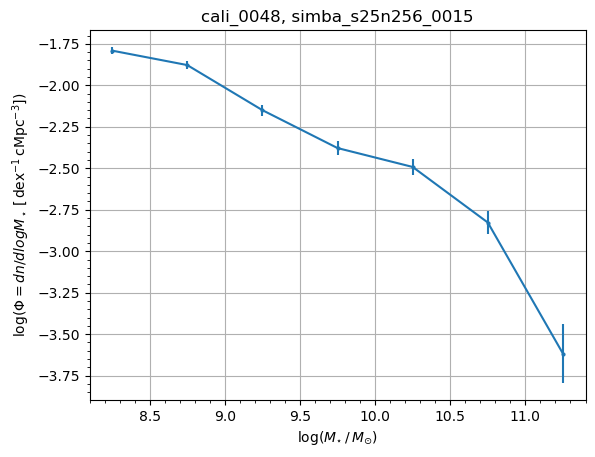

x:  [ 8.25  8.75  9.25  9.75 10.25 10.75 11.25]
y:  [-1.47880934 -1.29214404 -1.41073598 -1.54584388 -2.16737659 -2.68769312
 -4.0942333 ]
yerr:  [0.01512019 0.0121962  0.01398043 0.01633333 0.03340727 0.06081339
 0.30709257]


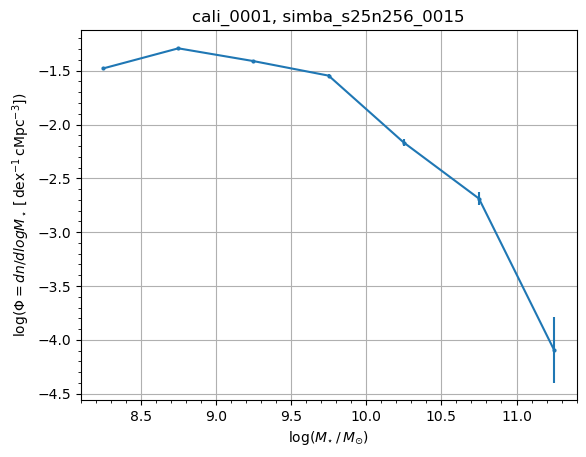

x:  [ 8.25  8.75  9.25  9.75 10.25 10.75 11.25]
y:  [-1.74301695 -1.71041793 -1.83655472 -2.20213869 -2.6549006  -3.16481437
 -4.39526329]
yerr:  [0.02049562 0.01974066 0.02282601 0.03477139 0.05856026 0.10533188
 0.43429448]


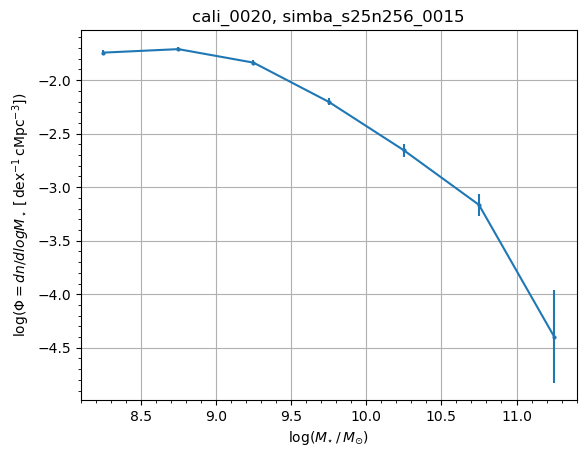

x:  [ 8.25  8.75  9.25  9.75 10.25 10.75]
y:  [-1.66126401 -1.59180618 -1.68009593 -2.13044547 -2.64707526 -3.28131994]
yerr:  [0.01865455 0.0172209  0.01906341 0.03201661 0.05803504 0.12045162]


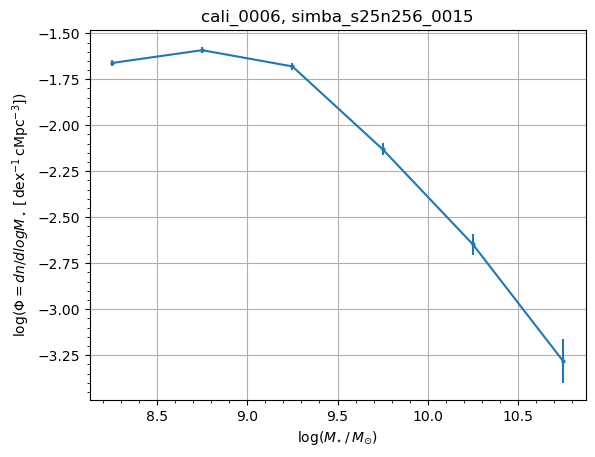

x:  [ 8.25  8.75  9.25  9.75 10.25 10.75 11.25 11.75]
y:  [-1.80419868 -1.8754353  -2.12342169 -2.38666312 -2.55016525 -2.78247944
 -2.99732328 -3.55016525]
yerr:  [0.02199136 0.02387098 0.03175876 0.04300156 0.05190812 0.0678254
 0.0868589  0.16414788]


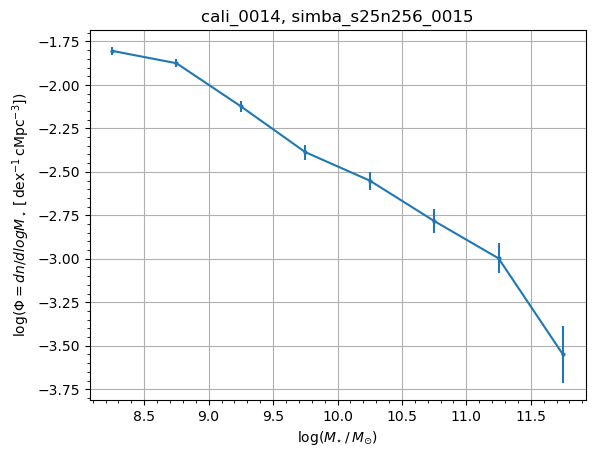

In [20]:
# Plot the observable to check it worked

for cali in sim_dict:
    print("x: ", sim_dict[cali]['logx'])
    print("y: ", sim_dict[cali]['logy'])
    print("yerr: ", sim_dict[cali]['mean_logy_err'])    
    
    plt.clf()
    plt.xlabel(X_LABEL)
    plt.ylabel(Y_LABEL)
    plt.title(r'%s, %s_%s' % (cali, snap_prefix, snap_num))
    plt.grid()
    plt.minorticks_on()
    plt.errorbar(sim_dict[cali]['logx'], sim_dict[cali]['logy'], yerr=sim_dict[cali]['mean_logy_err'], 
                 fmt='o-', markersize=2)
    plt.show()

## Specify the model parameters and values

In [21]:
parameter_files = [Path(os.path.join(cali_dir, cali+'.yml')) for cali_dir, cali in zip(cali_dirs, cali_list)]
parameter_filenames = {filename.stem: filename for filename in parameter_files}

In [22]:
# Doug's BH/AGN model
'''
model_specification, model_parameters = load_parameter_files(
    filenames=parameter_filenames,
    parameters=[
        "SIMBAAGN:xray_f_gas_limit",
        "SIMBAAGN:f_accretion",
        "SIMBAAGN:torque_accretion_norm",
        "SIMBAAGN:wind_momentum_flux"
    ],
    log_parameters=[
    ],
    parameter_printable_names=[
        "$f_{\\rm gas,xray}$",
        "$f_{\\rm acc}$",
        "$\epsilon_{\\rm torque}$",
        "Momentum flux"
    ],
)
'''

# swimba calibration

model_specification, model_parameters = load_parameter_files(
    filenames=parameter_filenames,
    parameters=[
        "SIMBAFeedback:FIRE_velocity_normalization",
        "SIMBAFeedback:FIRE_eta_normalization",
        "SIMBAAGN:torque_accretion_norm",
        "SIMBAAGN:jet_mass_min_Msun",
    ],
    log_parameters=[
        "SIMBAAGN:jet_mass_min_Msun",
    ],
    parameter_printable_names=[
        "$v_{a}$",
        "$\\eta_{0}$",
        "$\\varepsilon_{\\rm torque}$",
        "$\\log_{10}$ $M_{\\rm BH, lim}/M_{\\rm \odot}$",
    ],
)


# swimba calibration
'''
model_specification, model_parameters = load_parameter_files(
    filenames=parameter_filenames,
    parameters=[
        "SIMBAFeedback:FIRE_velocity_normalization",
        "SIMBAAGN:torque_accretion_norm",
    ],
    parameter_printable_names=[
        "$v_{a}$",
        "$\\varepsilon_{\\rm torque}$",
    ],
)
'''

'\nmodel_specification, model_parameters = load_parameter_files(\n    filenames=parameter_filenames,\n    parameters=[\n        "SIMBAFeedback:FIRE_velocity_normalization",\n        "SIMBAAGN:torque_accretion_norm",\n    ],\n    parameter_printable_names=[\n        "$v_{a}$",\n        "$\\varepsilon_{\\rm torque}$",\n    ],\n)\n'

In [37]:
modelvalues = {}
for cali in model_parameters.model_parameters:

    independent = sim_dict[cali]['logx']
    dependent = sim_dict[cali]['logy']
#    dependent_error = sim_dict[cali]['logy_err']
    dependent_error = sim_dict[cali]['mean_logy_err']
#    dependent_error = [0]*len(dependent)
#    dependent_error = [None]*len(dependent)
    
    modelvalues[cali] = {"independent": independent,
                         "dependent": dependent,
                         "dependent_error": dependent_error}
#    modelvalues[cali] = {"independent": independent,
#                         "dependent": dependent}

model_values = se.ModelValues(model_values=modelvalues)

## Model Parameter Features

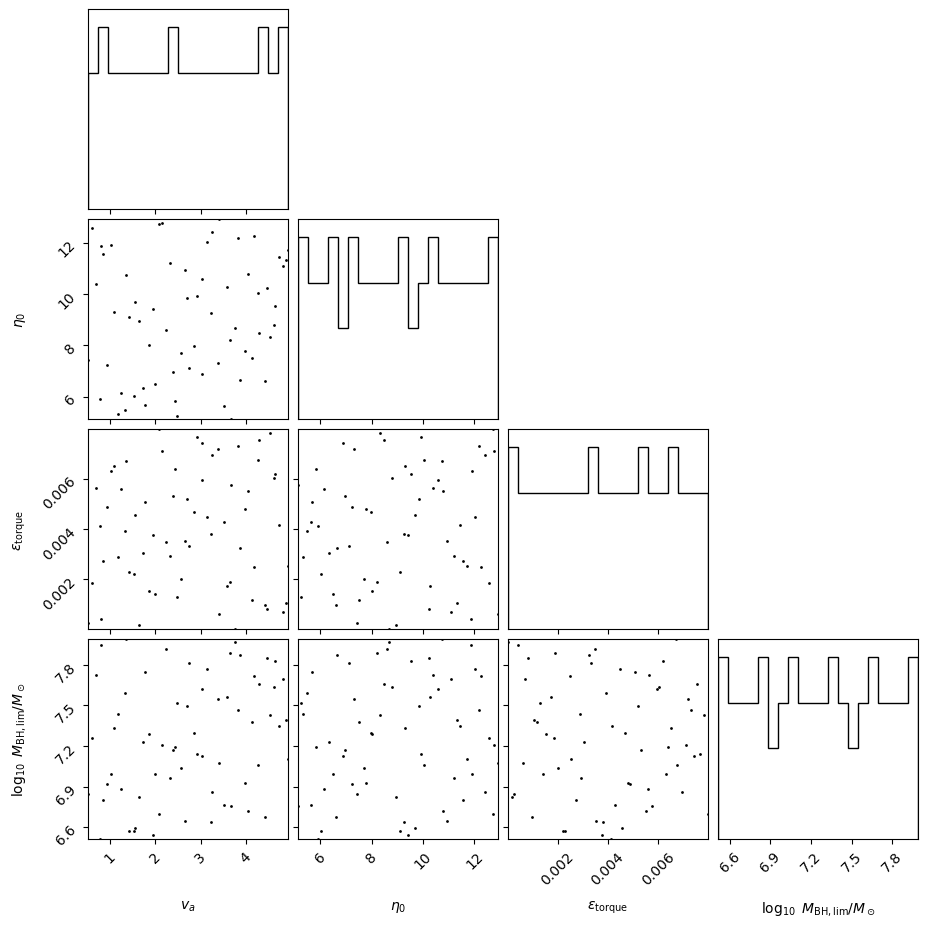

In [24]:
model_parameters.plot_model(model_specification)

## Train emulator

In [38]:
emulator = gaussian_process.GaussianProcessEmulator()  # Default
#emulator = gaussian_process_mcmc.GaussianProcessEmulatorMCMC(mcmc_steps=1000, burn_in_steps=1, walkers=40, use_hyperparameter_error=False)  # With MCMC
#emulator = gaussian_process_bins.GaussianProcessEmulatorBins()  # Gaussian Process Emulator using an emulator for each bins
#emulator = gaussian_process_one_dim.GaussianProcessEmulator1D()  # Gaussian Process Emulator for emulating single values
#emulator = linear_model.LinearModelEmulator(lasso_model_alpha=0)  # Linear Model Emulator
#emulator = multi_gaussian_process.MultipleGaussianProcessEmulator()  # A gaussian process emulator that uses _multiple_ internal emulators to better predict functions that contain a ‘break’.
#polynomial_model = PolynomialMeanModel(degree=2)  # Polynomial mean model
#emulator = gaussian_process.GaussianProcessEmulator(mean_model=polynomial_model)  # Mean model

emulator.fit_model(model_specification=model_specification,
                            model_parameters=model_parameters,
                            model_values=model_values)

## Make predictions and compare

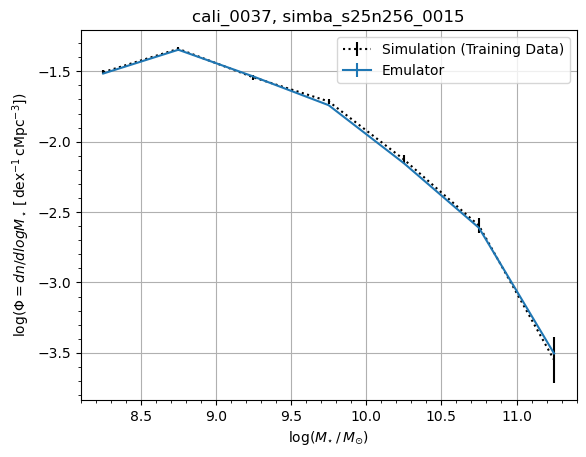

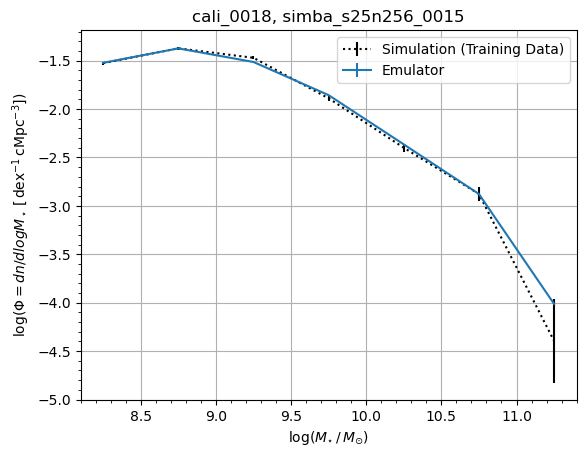

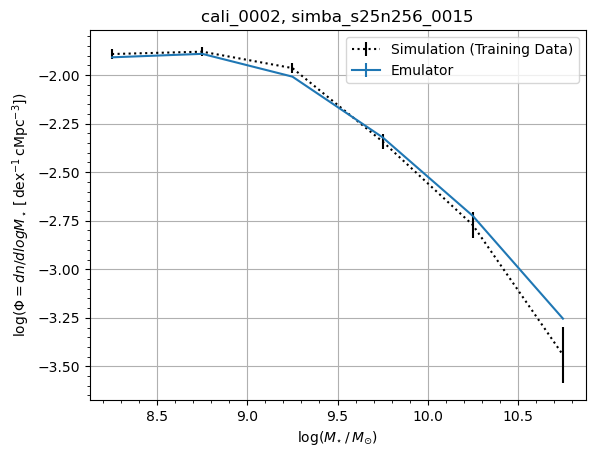

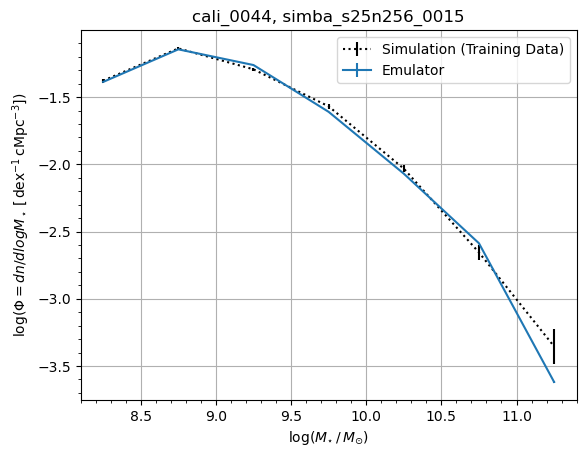

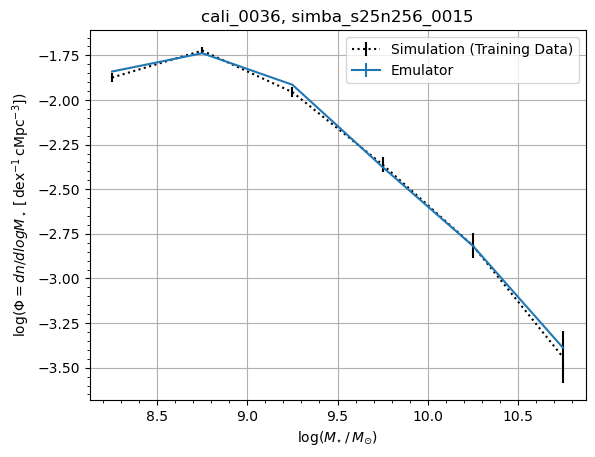

...

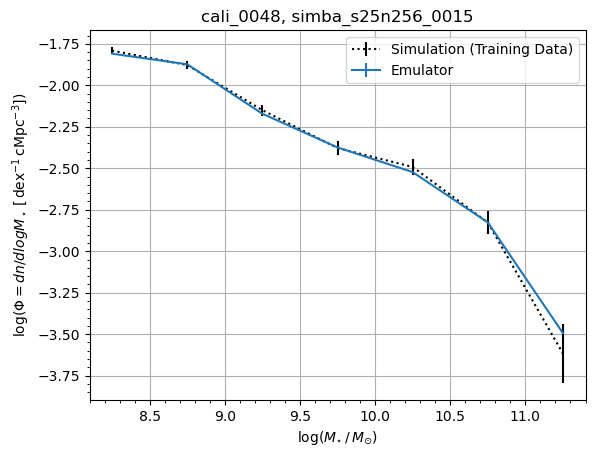

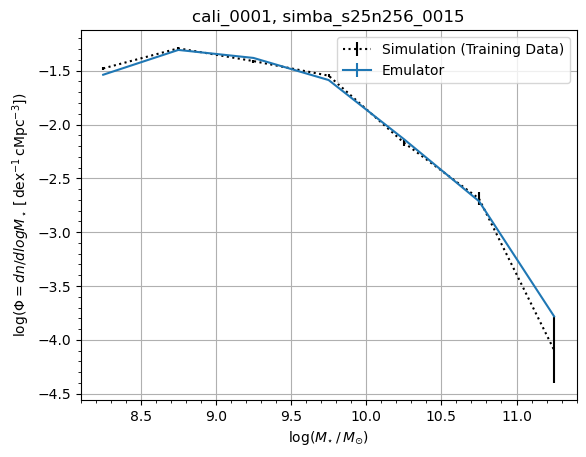

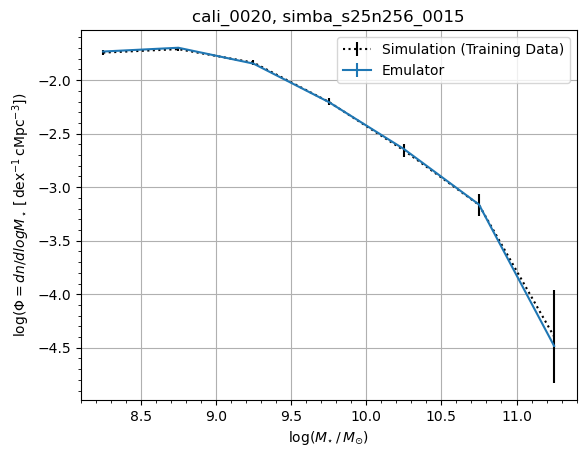

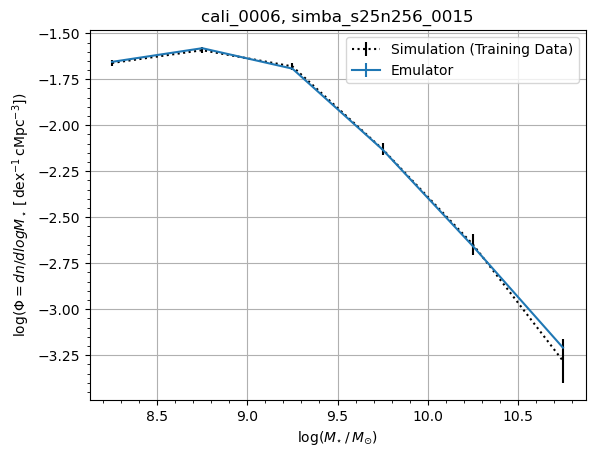

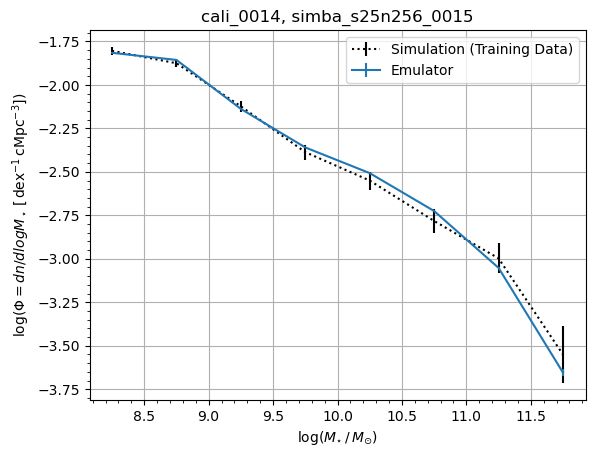

In [39]:
# Make predictions with trained emulator to compare to input

for cali in emulator.model_parameters.model_parameters:
    pred_params = emulator.model_parameters[cali]
    pred_x = emulator.model_values[cali]['independent']
    sim_y = emulator.model_values[cali]['dependent']
    sim_yerr = emulator.model_values[cali]['dependent_error']

    pred_y, pred_var = emulator.predict_values(pred_x, pred_params)

    plt.clf()
    plt.xlabel(X_LABEL)
    plt.ylabel(Y_LABEL)
    plt.title(r'%s, %s_%s' % (cali, snap_prefix, snap_num))
    plt.grid()
    plt.minorticks_on()
    plt.errorbar(pred_x, sim_y, yerr=sim_yerr, color="black", ls=":", label="Simulation (Training Data)")
    plt.errorbar(pred_x, pred_y, yerr=pred_var, ls='-', label='Emulator')
    plt.legend()
    plt.show()

## Parameter sensitivity analysis

In [40]:
gsmf_sensitivities = basic.binwise_sensitivity(specification=model_specification,
                                             parameters=model_parameters,
                                             values=model_values)
list(gsmf_sensitivities.values())

ZeroDivisionError: division by zero

In [155]:
gsmf_sensitivities=None

In [157]:
fig, ax = basic.plot_binwise_sensitivity(specification=model_specification,
                                         sensitivities=gsmf_sensitivities,
                                         xlabel=X_LABEL,
                                         cbarlabel='Sensitivity',
                                         vmin=np.min(list(gsmf_sensitivities.values())),
                                         vmax=np.max(list(gsmf_sensitivities.values())))

fig.set_size_inches(8, 8, forward=True)

AttributeError: 'NoneType' object has no attribute 'values'

## Perform cross check (validation)

In [34]:
gsmf_ccheck = cross_check.CrossCheck(hide_progress=False)
gsmf_ccheck.build_emulators(model_specification=model_specification,
                        model_parameters=model_parameters,
                        model_values=model_values)

  0%|          | 0/64 [00:01<?, ?it/s]


ValueError: array must not contain infs or NaNs

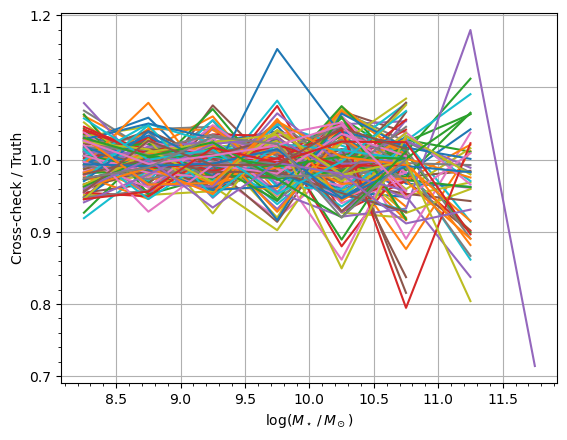

In [159]:
data_by_cc = gsmf_ccheck.build_mocked_model_values_original_independent()

for unique_identifier in gsmf_ccheck.model_values.model_values:
    cc_over_og = data_by_cc[unique_identifier]["dependent"] / \
                model_values[unique_identifier]["dependent"]
#    cc_minus_og_over_og = (data_by_cc[unique_identifier]["dependent"] / \
#                           model_values[unique_identifier]["dependent"])/ model_values[unique_identifier]["dependent"]
    plt.plot(data_by_cc[unique_identifier]["independent"], cc_over_og)

plt.grid()
plt.minorticks_on()
plt.xlabel(X_LABEL)
plt.ylabel("Cross-check / Truth")
plt.show()

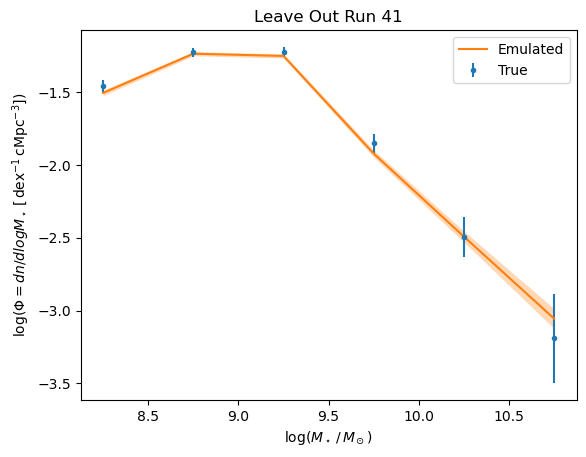

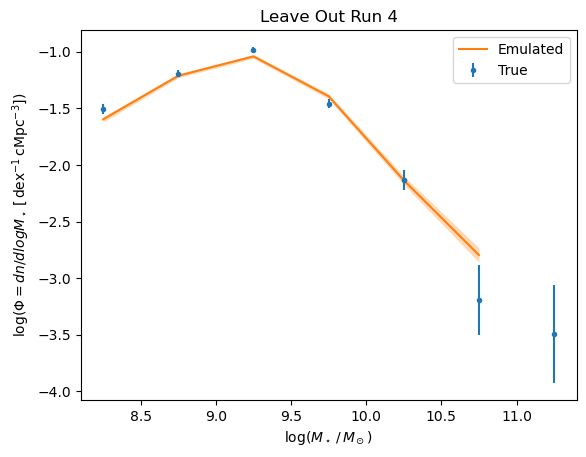

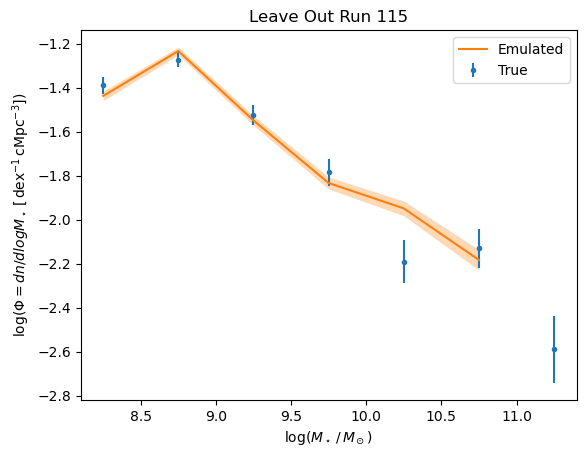

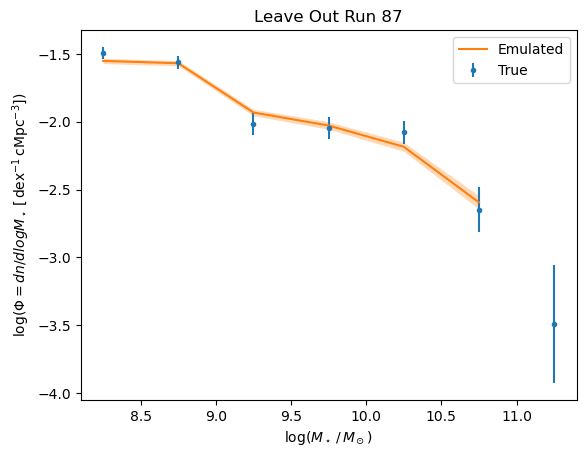

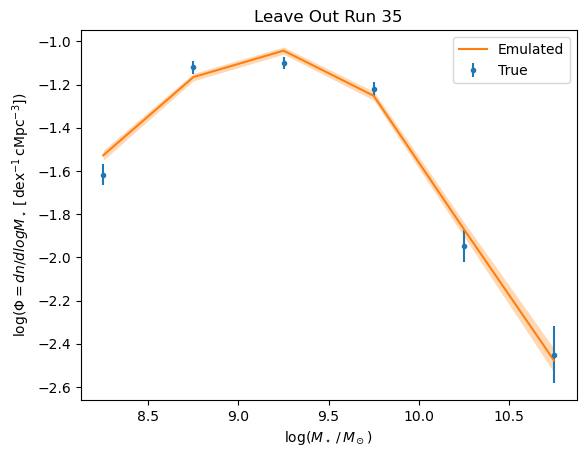

...

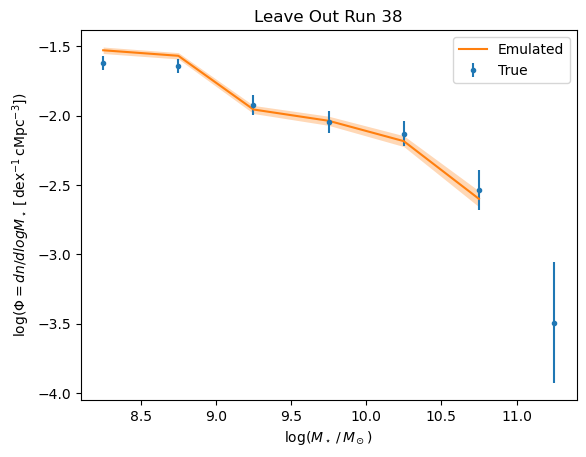

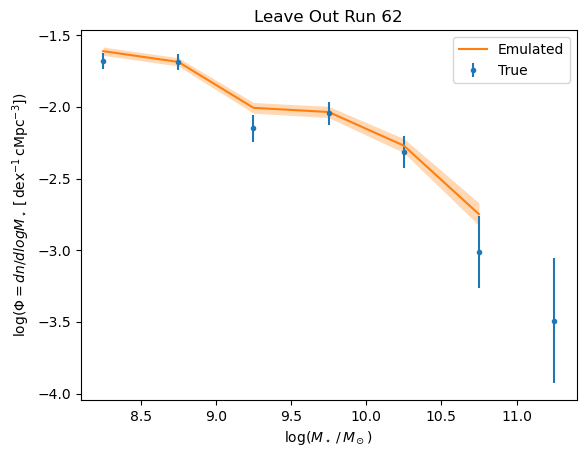

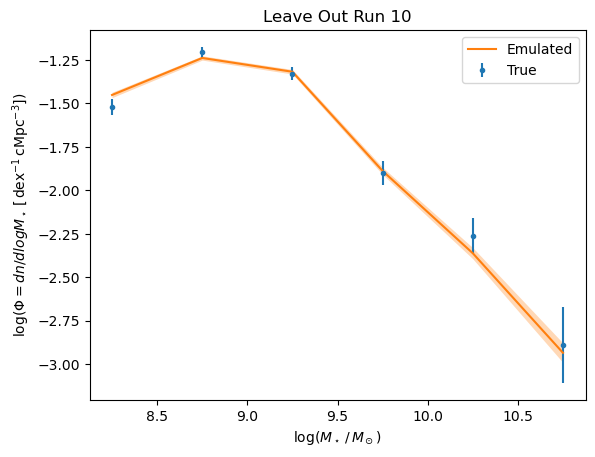

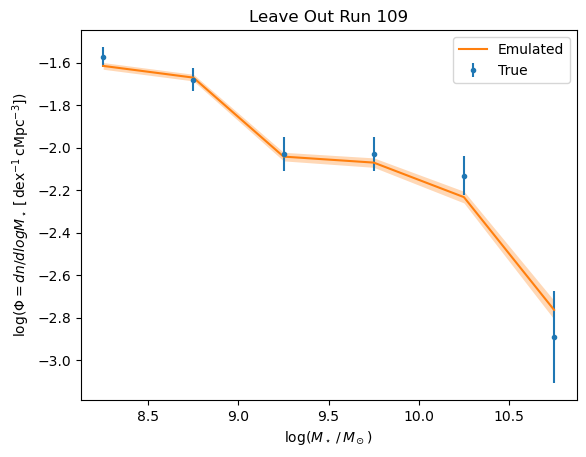

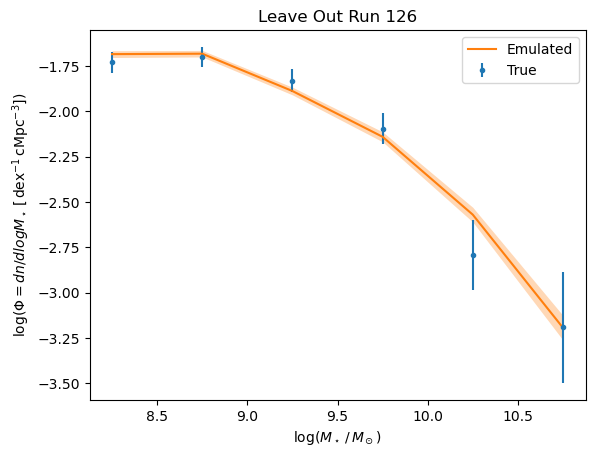

In [160]:
gsmf_ccheck.plot_results(emulate_at=data_by_cc[unique_identifier]["independent"],
                         xlabel=X_LABEL,
                         ylabel=r'$\log (\Phi=dn/dlogM_\star\,[\,\mathrm{dex}^{-1}\,\mathrm{cMpc}^{-3}])$')

In [161]:
total_mean_squared = gsmf_ccheck.get_mean_squared()[0]
print("Total mean squared of entire set of left-out simulations: %s" % total_mean_squared)

Total mean squared of entire set of left-out simulations: 0.012261992034905977


## Sweeps of parameter space

In [43]:
# Get full range of x values that have been used in training emulator

sim_x = []
for cali in emulator.model_values.model_values:
    sim_x_curr = emulator.model_values[cali]['independent']
    for x_val in sim_x_curr:
        if x_val not in sim_x:
            sim_x.append(x_val)
            
sim_x = np.array(np.sort(sim_x))
print(sim_x)

[ 8.25  8.75  9.25  9.75 10.25 10.75 11.25 11.75 12.25]


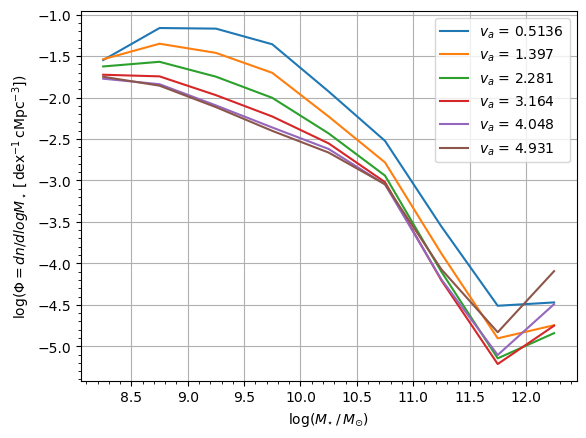

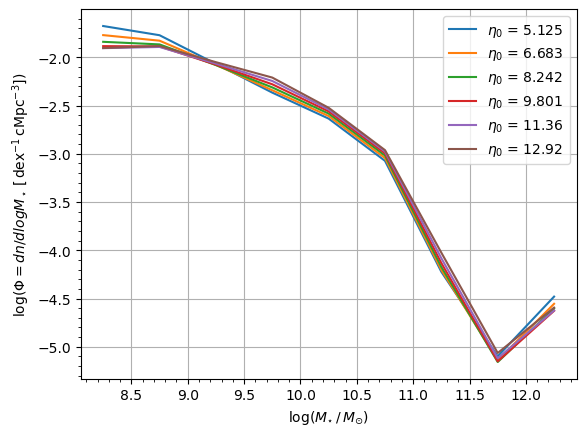

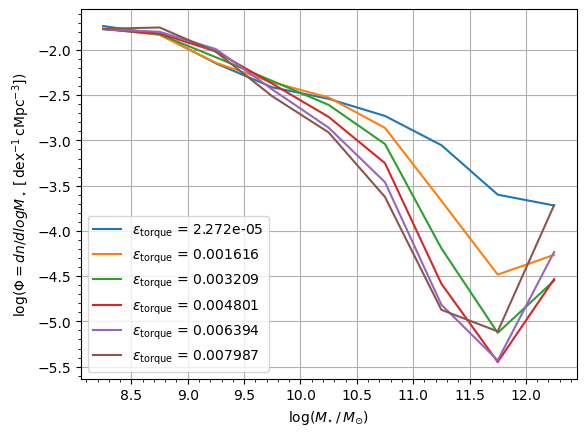

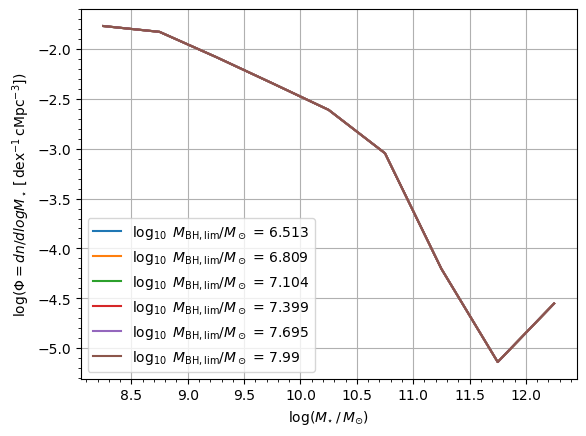

In [42]:
# Arbitrarily choose initial parameters to sweep from
# Doesn't matter too much though, because it ends up covering
# roughly the entire range of parameters used

centre = emulator.model_parameters['cali_0000']

param_printable_names = []
for ii in range(len(emulator.parameter_order)):
    param_name = emulator.parameter_order[ii]
    param_printable_name = emulator.model_specification.parameter_printable_names[ii]
    param_printable_names.append(param_printable_name)
    
    Mock_values, Mock_parameters = mock_sweep(emulator, emulator.model_specification, 6, param_name, centre)

    plt.clf()
    
    for mock_name in Mock_values.keys():
        plt.plot(Mock_values[mock_name]["independent"],
                Mock_values[mock_name]["dependent"],
                label = "%s = %.4g" % (param_printable_name, Mock_parameters[mock_name][param_name]))
    
    plt.xlabel(X_LABEL)
    plt.ylabel(Y_LABEL)
    plt.grid()
    plt.minorticks_on()
    plt.legend()
    plt.show()

## Checking hyperparameters (doesn't always work)

In [44]:
emulator.kernel.get_parameter_dict(include_frozen=True)

OrderedDict([('k1:log_constant', -1.6094379124341003),
             ('k2:metric:log_M_0_0', 0.0),
             ('k2:metric:log_M_1_1', 0.0),
             ('k2:metric:log_M_2_2', 0.0),
             ('k2:metric:log_M_3_3', 0.0),
             ('k2:metric:log_M_4_4', 0.0)])

In [45]:
emulator_mcmc = gaussian_process_mcmc.GaussianProcessEmulatorMCMC(burn_in_steps=1, mcmc_steps=1000)#, hide_progress=False)
emulator_mcmc.fit_model(model_specification=model_specification,
                        model_parameters=model_parameters,
                        model_values=model_values)

emcee: Exception while calling your likelihood function:
  params: [  -1.0674339    -1.49347358    2.92631264    6.87671166   -9.52335474
 -750.20188364]
  args: []
  kwargs: {}
  exception:


Traceback (most recent call last):
  File "/home/b/babul/aspadawe/miniconda3/envs/yt_swift_caesar/lib/python3.9/site-packages/emcee/ensemble.py", line 624, in __call__
    return self.f(x, *self.args, **self.kwargs)
  File "/gpfs/fs1/home/b/babul/aspadawe/src/emulator/swiftemulator/emulators/gaussian_process_mcmc.py", line 249, in log_likelihood
    return -negative_log_likelihood(p)
  File "/gpfs/fs1/home/b/babul/aspadawe/src/emulator/swiftemulator/emulators/gaussian_process_mcmc.py", line 242, in negative_log_likelihood
    return -gaussian_process.log_likelihood(self.dependent_variables)
  File "/home/b/babul/aspadawe/miniconda3/envs/yt_swift_caesar/lib/python3.9/site-packages/george/gp.py", line 385, in log_likelihood
    if not self.recompute(quiet=quiet):
  File "/home/b/babul/aspadawe/miniconda3/envs/yt_swift_caesar/lib/python3.9/site-packages/george/gp.py", line 355, in recompute
    self.compute(self._x, np.sqrt(self._yerr2), **kwargs)
  File "/home/b/babul/aspadawe/miniconda3

ValueError: array must not contain infs or NaNs

In [165]:
emulator_mcmc.kernel.get_parameter_dict(include_frozen=True)

OrderedDict([('k1:log_constant', -1.6094379124341003),
             ('k2:metric:log_M_0_0', 0.0),
             ('k2:metric:log_M_1_1', 0.0),
             ('k2:metric:log_M_2_2', 0.0),
             ('k2:metric:log_M_3_3', 0.0),
             ('k2:metric:log_M_4_4', 0.0)])

In [46]:
emulator_mcmc.plot_hyperparameter_distribution()

AttributeError: 'GaussianProcessEmulatorMCMC' object has no attribute 'hyperparameter_samples'

# Compare with observational data

## Load observational data

In [47]:
observable = 'Baldry12_gsmf'
#observational_paper = 'KormendyHo2013'
observation = load_observations(
    '/home/b/babul/aspadawe/data/observations/gsmf/'+observable+'.hdf5'
)[0]
print(observation.cosmology)

FlatLambdaCDM(name="Flat $\Lambda$CDM", H0=70.0 km / (Mpc s), Om0=0.3, Tcmb0=0.0 K, Neff=3.04, m_nu=None, Ob0=0.0)


## Penalty function

In [49]:
sim_file = os.path.join(snap_dir, cali_list[0], snap_prefix+'_'+obs_name+'_'+snap_num+'.hdf5')
sim_data = load_observations(sim_file)[0]
x_unit = sim_data.x.units
y_unit = sim_data.y.units
#print(x_unit)

#penalty_calculator = L2PenaltyCalculator(offset = 0.5, lower=min(np.log10(observation.x)),upper=max(np.log10(observation.x))+1)
penalty_calculator = GaussianDataErrorsPercentFloorPenaltyCalculator(percent_error=20,
                                                                     sigma_max=3,
                                                                     lower=min(np.log10(observation.x)),
                                                                     upper=max(np.log10(observation.x))+1)

penalty_calculator.register_observation(observation,
                                log_independent=True,
                                log_dependent=True,
                                independent_units=x_unit,
                                dependent_units=y_unit)

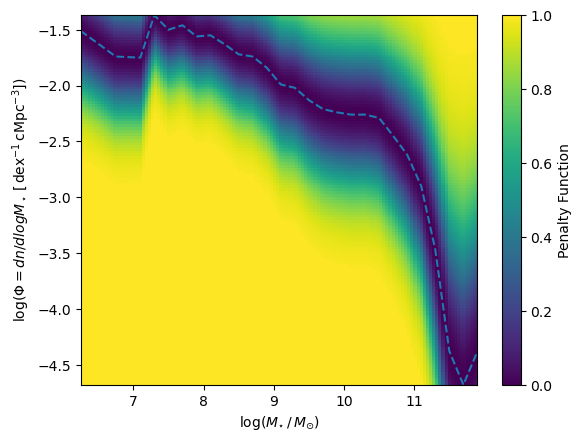

In [50]:
penalty_calculator.plot_penalty(min(np.log10(observation.x)),max(np.log10(observation.x)),
                        min(np.log10(observation.y)),max(np.log10(observation.y)),
                        observable,
                        x_label=X_LABEL,
                        y_label=Y_LABEL,
                        resolution=128)

In [51]:
# Get full range of x values that have been used in training emulator

sim_x = []
for cali in emulator.model_values.model_values:
    sim_x_curr = emulator.model_values[cali]['independent']
    for x_val in sim_x_curr:
        if x_val not in sim_x:
            sim_x.append(x_val)
            
sim_x = np.array(np.sort(sim_x))
print(sim_x)

[ 8.25  8.75  9.25  9.75 10.25 10.75 11.25 11.75 12.25]


In [248]:
# Separate out data into x, y, yerr
# Get only data that corresponds to chosen x range of simulation
# (Need to use GaussianDataErrorsPercentFloorPenaltyCalculator to do this)

x = []
for cali in emulator.model_values.model_values:
    x_curr = emulator.model_values[cali]['independent']
#    if len(x_curr) > len(x):
#        x = x_curr
    for x_val in x_curr:
        if x_val not in x:
            x.append(x_val)
            
x.sort()
print(x)

# Using the penalty calculator's internal interpolator produces logged data
# so long as log_independent and log_dependent are set to True
penalty_calculator.observation_interpolation()
y = penalty_calculator.interpolator_values(x)
yerr = penalty_calculator.error_interpolator_values(x)  # can only use for certain penalty calculators, eg. GaussianDataErrorsPercentFloorPenaltyCalculator

data = (x, y, yerr)

In [52]:
# Separate out data into x, y, yerr
# Get only data that corresponds to chosen x range of simulation
# (Need to use GaussianDataErrorsPercentFloorPenaltyCalculator to do interpolation for this)

# Using the penalty calculator's internal interpolator produces logged data
# so long as log_independent and log_dependent are set to True
x = sim_x
penalty_calculator.observation_interpolation()
y = penalty_calculator.interpolator_values(x)
yerr = penalty_calculator.error_interpolator_values(x)  # can only use for certain penalty calculators, eg. GaussianDataErrorsPercentFloorPenaltyCalculator
#print(yerr)

if (yerr.ndim!=1):
    mean_yerr = np.nanmean(yerr, axis=0)
else:
    mean_yerr = yerr

data_interp = (x, y, mean_yerr)
print(data_interp)

(array([ 8.25,  8.75,  9.25,  9.75, 10.25, 10.75, 11.25, 11.75, 12.25]), array([-1.61  , -1.765 , -2.0125, -2.2175, -2.26  , -2.4925, -3.3275,
       -4.605 , -4.38  ]), array([0.0475, 0.0575, 0.02  , 0.03  , 0.03  , 0.0325, 0.0875, 0.2825,
       0.23  ]))


In [53]:
# Separate out data into x, y, yerr
# Get only data that falls within chosen x range of simulation, but is still original data without interpolation

x = np.log10(penalty_calculator.observation.x.value)
y = np.log10(penalty_calculator.observation.y.value)
yerr = penalty_calculator.observation.y_scatter.value / (np.log(10) * 10**y)
#print(x)
if (yerr.ndim!=1):
    mean_yerr = np.nanmean(yerr, axis=0)
else:
    mean_yerr = yerr
#print(x)
#print(y)
#print()
    
sort_condition = np.argsort(x)
#print(sort_condition)
x = x[sort_condition]
y = y[sort_condition]
mean_yerr = mean_yerr[sort_condition]
#print(x)
#print(y)
#print()

range_condition = np.logical_and(x >= min(sim_x), x <= max(sim_x))
#print(range_condition)
x = x[range_condition]
y = y[range_condition]
mean_yerr = mean_yerr[range_condition]
#yerr = yerr[range_condition]

data_og_lim = (x, y, mean_yerr)
print(data_og_lim)

(array([ 8.3,  8.5,  8.7,  8.9,  9.1,  9.3,  9.5,  9.7,  9.9, 10.1, 10.3,
       10.5, 10.7, 10.9, 11.1, 11.3, 11.5, 11.7, 11.9]), array([-1.63, -1.72, -1.74, -1.84, -1.99, -2.02, -2.13, -2.21, -2.24,
       -2.26, -2.26, -2.29, -2.45, -2.62, -2.9 , -3.47, -4.38, -4.68,
       -4.38]), array([0.05, 0.03, 0.06, 0.05, 0.02, 0.02, 0.02, 0.03, 0.03, 0.03, 0.03,
       0.03, 0.03, 0.04, 0.05, 0.1 , 0.23, 0.3 , 0.23]))


In [54]:
# Get just full range of data

x = np.log10(penalty_calculator.observation.x.value)
y = np.log10(penalty_calculator.observation.y.value)
yerr = penalty_calculator.observation.y_scatter.value / (np.log(10) * 10**y)

#x = penalty_calculator.observation.x.value
#y = penalty_calculator.observation.y.value
#yerr = penalty_calculator.observation.y_scatter.value

if (yerr.ndim!=1):
    mean_yerr = np.nanmean(yerr, axis=0)
else:
    mean_yerr = yerr
    
sort_condition = np.argsort(x)
x = x[sort_condition]
y = y[sort_condition]
mean_yerr = mean_yerr[sort_condition]

data_og_full = (x, y, mean_yerr)
print(data_og_full)

(array([ 6.25,  6.75,  7.1 ,  7.3 ,  7.5 ,  7.7 ,  7.9 ,  8.1 ,  8.3 ,
        8.5 ,  8.7 ,  8.9 ,  9.1 ,  9.3 ,  9.5 ,  9.7 ,  9.9 , 10.1 ,
       10.3 , 10.5 , 10.7 , 10.9 , 11.1 , 11.3 , 11.5 , 11.7 , 11.9 ]), array([-1.51, -1.74, -1.75, -1.37, -1.5 , -1.46, -1.56, -1.55, -1.63,
       -1.72, -1.74, -1.84, -1.99, -2.02, -2.13, -2.21, -2.24, -2.26,
       -2.26, -2.29, -2.45, -2.62, -2.9 , -3.47, -4.38, -4.68, -4.38]), array([0.23, 0.14, 0.12, 0.08, 0.11, 0.09, 0.06, 0.04, 0.05, 0.03, 0.06,
       0.05, 0.02, 0.02, 0.02, 0.03, 0.03, 0.03, 0.03, 0.03, 0.03, 0.04,
       0.05, 0.1 , 0.23, 0.3 , 0.23]))


In [55]:
data = copy.deepcopy(data_og_full)

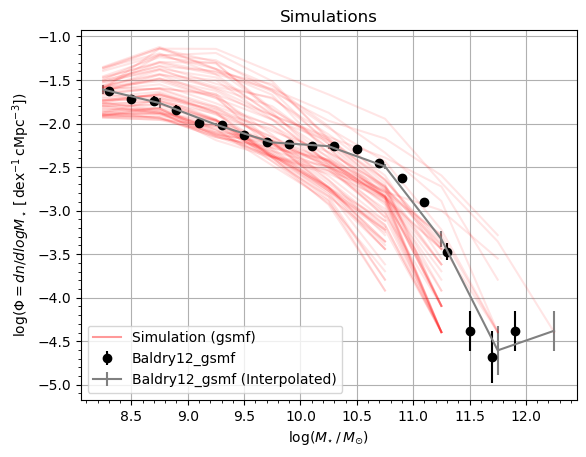

In [60]:
# Plot simulated observations over data

plt.clf()
#plt.errorbar(data_og_full[0], data_og_full[1], yerr=data_og_full[2], color="black", ls="", fmt='o', label=observable)
#plt.errorbar(data_og_full[0], data_og_full[1], yerr=data_og_full[2], color="black", ls="-", label=observable)
plt.errorbar(data_og_lim[0], data_og_lim[1], yerr=data_og_lim[2], color="black", ls="", fmt='o', label=observable)
plt.errorbar(data_interp[0], data_interp[1], yerr=data_interp[2], color="grey", ls="-", label="%s (Interpolated)" % observable)
#plt.errorbar(data[0], data[1], yerr=data[2], color="black", ls="-", label=observable)
#plt.errorbar(10**data[0], 10**data[1], yerr=data[2]*np.log(10)*10**data[1], color="grey", ls="-", label="%s (Interpolated)" % observable)

for cali in emulator.model_parameters.model_parameters:
    pred_params = emulator.model_parameters[cali]
    pred_x = emulator.model_values[cali]['independent']
    sim_y = emulator.model_values[cali]['dependent']

    pred_y, pred_var = emulator.predict_values(pred_x, pred_params)

#    plt.plot(pred_x, pred_y, color="r", alpha=0.1)
    plt.plot(pred_x, sim_y, color="r", alpha=0.1)
#    plt.plot(10**pred_x, 10**sim_y, color="r", alpha=0.1)
    
plt.plot([],[],color="r", alpha=0.4, label='Simulation (%s)' % obs_name)

plt.xlabel(X_LABEL)
plt.ylabel(Y_LABEL)
plt.title('Simulations')
#plt.xscale('log')
#plt.yscale('log')
plt.grid()
plt.minorticks_on()
plt.legend()
plt.show()

In [62]:
# Check which input simulation best fits the observational data

all_penalties = penalty_calculator.penalties(emulator.model_values, np.mean)

all_penalties_array = []
node_number = []
for key in all_penalties.keys():
    all_penalties_array.append(all_penalties[key])
    node_number.append(key)

best_node = node_number[np.argmin(all_penalties_array)]

print("Best fit node = ", best_node)

pred_params_best_node = emulator.model_parameters[best_node].copy()
print("Parameter values for best fit node:")
print(pred_params_best_node)

Best fit node =  cali_0049
Parameter values for best fit node:
{'SIMBAFeedback:FIRE_velocity_normalization': 2.479111479694143, 'SIMBAFeedback:FIRE_eta_normalization': 5.247995351238637, 'SIMBAAGN:torque_accretion_norm': 0.0012893489506170723, 'SIMBAAGN:jet_mass_min_Msun': 7.517800819480263}


In [64]:
# Check penalty of best fit node
pred_params_best_node = emulator.model_parameters[best_node].copy()
x_to_predict = emulator.model_values[best_node]['independent']
pred_y, pred_var = emulator.predict_values(x_to_predict, pred_params_best_node)
sim_y = emulator.model_values[best_node]['dependent']

print("Mean Penalty of node %s from simulation = %s" % (best_node, np.mean(penalty_calculator.penalty(x_to_predict, sim_y))))
print("Mean Penalty of node %s from emulator prediction = %s" % (best_node, np.mean(penalty_calculator.penalty(x_to_predict, pred_y))))

#Let's change one of the parameters and see if it improves the fit
pred_params_change = pred_params_best_node.copy()
pred_params_change["SIMBAFeedback:FIRE_velocity_normalization"] += 0.1
pred_y, pred_var = emulator.predict_values(x_to_predict, pred_params_change)

print("Mean after change (from emulator prediction) = %s" % np.mean(penalty_calculator.penalty(x_to_predict, pred_y)))

Mean Penalty of node cali_0049 from simulation = 0.052165724794230504
Mean Penalty of node cali_0049 from emulator prediction = 0.04825191703572491
Mean after change (from emulator prediction) = 0.0423540053769707


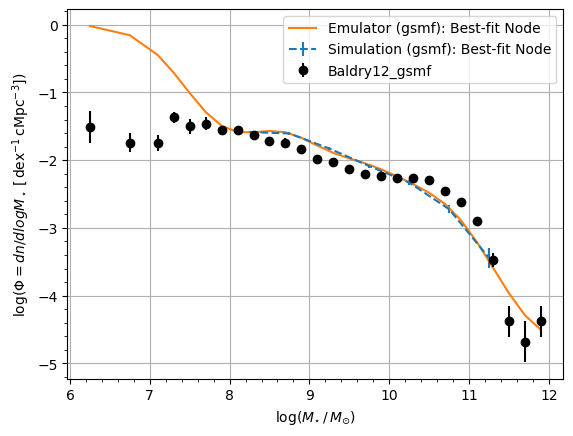

In [69]:
# Plot best fit node and data

#pred_x = np.log10(penalty_calculator.observation.x.value)
pred_x = data[0]
#pred_x = data_og_lim[0]
#pred_x = sim_x
pred_y, pred_var = emulator.predict_values(pred_x, pred_params_best_node)

plt.clf()
plt.xlabel(X_LABEL)
plt.ylabel(Y_LABEL)
plt.grid()
plt.minorticks_on()
plt.errorbar(emulator.model_values[best_node]['independent'], emulator.model_values[best_node]['dependent'],
             emulator.model_values[best_node]['dependent_error'], ls='--',
             label='Simulation (%s): Best-fit Node' % obs_name)
plt.plot(pred_x, pred_y, ls='-', label='Emulator (%s): Best-fit Node' % obs_name)

#plt.errorbar(data_interp[0], data_interp[1], yerr=data_interp[2], color="grey", ls="-", label="%s (Interpolated)" % observable)
plt.errorbar(data_og_full[0], data_og_full[1], yerr=data_og_full[2], color="black", ls="", fmt='o', label=observable)
#plt.errorbar(data_og_full[0], data_og_full[1], yerr=data_og_full[2], color="black", ls="-", label=observable)
#plt.errorbar(data_og_full[0], data_og_full[1], yerr=None, color="black", ls="", fmt='o', label=observable)
#plt.errorbar(data[0], data[1], yerr=data[2], color="black", ls="", fmt='o', label=observable)
#plt.errorbar(data_og_lim[0], data_og_lim[1], yerr=data_og_lim[2], color="black", ls="", fmt='o', label=observable)
plt.legend()
plt.show()

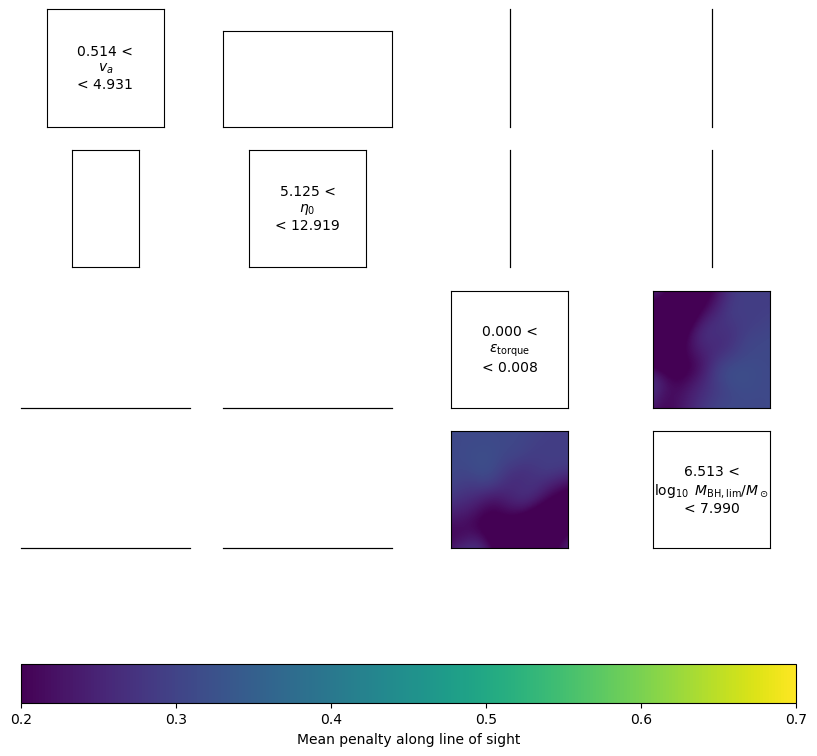

In [70]:
fig, ax = visualise_penalties_mean(emulator.model_specification, emulator.model_parameters, all_penalties,
                                   remove_ticks=True,
                                   figsize=(10,10),
                                   use_colorbar=True)

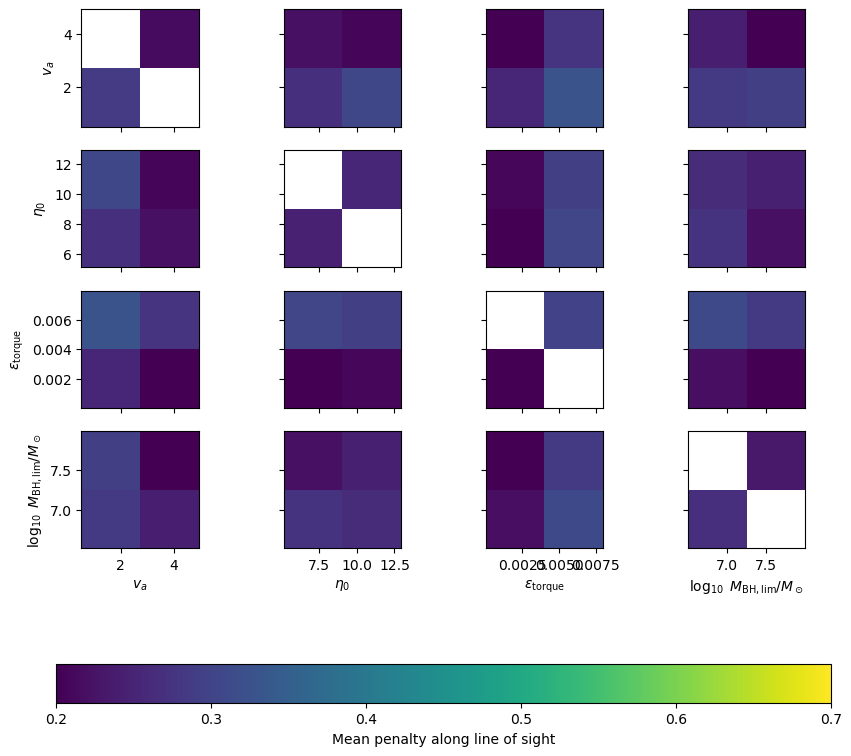

In [71]:
# Statistic options are: mean, std, median, count, sum, min, max, OR user defined function
fig, ax = visualise_penalties_generic_statistic(emulator.model_specification, emulator.model_parameters, all_penalties,
                                                statistic='mean',
                                                remove_ticks=False,
                                                figsize=(10,10),
                                                use_colorbar=True)

## Fit emulator model to observational data

In [72]:
# Get min and max values of each parameter that go into original simulations
# They will be the MCMC parameter limits

param_mins_arr = np.zeros(len(emulator.parameter_order), float)
param_maxs_arr = np.zeros(len(emulator.parameter_order), float)
param_values = {}
param_mins = {}
param_maxs = {}
for param in emulator.parameter_order:
    idx = emulator.parameter_order.index(param)
    param_values[param] = list([])

    for mod, vals in emulator.model_parameters.items():
        param_values[param].append(vals[param])
    
    param_mins[param] = min(param_values[param])
    param_maxs[param] = max(param_values[param])
    
    param_mins_arr[idx] = min(param_values[param])
    param_maxs_arr[idx] = max(param_values[param])
    
print("Prior lower bounds:", param_mins)
print("Prior upper bounds:", param_maxs)

Prior lower bounds: {'SIMBAFeedback:FIRE_velocity_normalization': 0.5135533480388197, 'SIMBAFeedback:FIRE_eta_normalization': 5.124501026363533, 'SIMBAAGN:torque_accretion_norm': 2.272127984101306e-05, 'SIMBAAGN:jet_mass_min_Msun': 6.513342867201439}
Prior upper bounds: {'SIMBAFeedback:FIRE_velocity_normalization': 4.931217357505275, 'SIMBAFeedback:FIRE_eta_normalization': 12.919378139596745, 'SIMBAAGN:torque_accretion_norm': 0.007987233837840087, 'SIMBAAGN:jet_mass_min_Msun': 7.990229449976196}


In [255]:
# If you want to specify other parameter priors for the MCMC

param_mins_arr = [0.5, 5.0, 0.00001, 6.5]
param_maxs_arr = [5.0, 13.0, 0.008, 8.0]
#param_mins_arr = [0.5, 5.0, 0.0005, 7.0]
#param_maxs_arr = [5.0, 13.0, 0.008, 8.0]
param_mins = {}
param_maxs = {}

for param in emulator.parameter_order:
    idx = emulator.parameter_order.index(param)
    param_mins[param] = param_mins_arr[idx]
    param_maxs[param] = param_maxs_arr[idx]
    
print("Prior lower bounds:", param_mins)
print("Prior upper bounds:", param_maxs)

Prior lower bounds: {'SIMBAFeedback:FIRE_velocity_normalization': 0.5, 'SIMBAFeedback:FIRE_eta_normalization': 5.0, 'SIMBAAGN:torque_accretion_norm': 1e-05, 'SIMBAAGN:jet_mass_min_Msun': 6.5}
Prior upper bounds: {'SIMBAFeedback:FIRE_velocity_normalization': 5.0, 'SIMBAFeedback:FIRE_eta_normalization': 13.0, 'SIMBAAGN:torque_accretion_norm': 0.008, 'SIMBAAGN:jet_mass_min_Msun': 8.0}


In [73]:
def model(theta, x):
    params = emulator.model_parameters[best_node].copy()

    for ii in range(len(theta)):
        key = list(params.keys())[ii]
        params[key] = theta[ii]

    val, var = emulator.predict_values(x, params)
    return val


def lnlike(theta, x, y, yerr):
    m = model(theta, x=x)
    
#    LnLike = sum(norm.logpdf(y, loc=m, scale=yerr))  # One way to get LnLike with scipy.stats
    LnLike = -0.5 * sum(np.power((y - m)*np.power(yerr,-1), 2))  # Get likelihood (assuming indepenent Gaussian error bars?)
    
#    sigma2 = yerr**2 + m**2
#    LnLike = -0.5 * np.sum((y - m)**2 / sigma2 + np.log(sigma2))  # Likelihood (no assumptions?)
    
#    LnLike = -0.5 * sum(np.power((y - m), 2))  # If no error bars on data
#    LnLike = -np.sum(penalty_calculator.penalty(x, m))  # if want to use L2 penalty (should be using mean? use sum?)
#    LnLike = -np.mean(penalty_calculator.penalty(x, m, dependent_error=yerr))

#    LnLike = -np.sum((y - m)**2 / 0.5**2)
    
    return LnLike


def within_limits(theta):
    result = True
    for ii in range(len(theta)):
        result = result and (param_mins_arr[ii] <= theta[ii] and theta[ii] <= param_maxs_arr[ii])
        
    return result

def lnprior(theta):
    if within_limits(theta):
        return 0.0
    else:
        return -np.inf
    
def lnprob(theta, x, y, yerr):
    lp = lnprior(theta)
    if not np.isfinite(lp):
        return -np.inf
    return lp + lnlike(theta, x, y, yerr)  # if lp not -inf, its 0, so this just returns likelihood

In [74]:
# Get initial estimate of parameters from scipy optimizer
np.random.seed(42)
nll = lambda *args: -lnlike(*args)

initial_opt = list(pred_params_best_node.values())
print(initial_opt)
soln = minimize(nll, initial_opt, args=data)
print(soln)

[2.479111479694143, 5.247995351238637, 0.0012893489506170723, 7.517800819480263]
  message: Desired error not necessarily achieved due to precision loss.
  success: False
   status: 2
      fun: 366.05113340390824
        x: [ 2.479e+00  5.248e+00  4.773e-04  7.518e+00]
      nit: 4
      jac: [ 0.000e+00  0.000e+00  1.448e+00  0.000e+00]
 hess_inv: [[ 1.000e+00  0.000e+00  0.000e+00  0.000e+00]
            [ 0.000e+00  1.000e+00  0.000e+00  0.000e+00]
            [ 0.000e+00  0.000e+00  5.013e-09  0.000e+00]
            [ 0.000e+00  0.000e+00  0.000e+00  1.000e+00]]
     nfev: 381
     njev: 74


In [76]:
# Parameters for MCMC run
initial_mcmc = soln.x
ndim = len(initial_mcmc)
niter = 1000
nwalkers = 32
p0 = [np.array(initial_mcmc) + 1e-7 * np.random.randn(ndim) for i in range(nwalkers)]

In [78]:
# Function for running production iterations of MCMC
def main(p0, nwalkers, niter, ndim, lnprob, data):
    sampler = emcee.EnsembleSampler(nwalkers, ndim, lnprob, args=data)

    print("Running production...")
    pos, prob, state = sampler.run_mcmc(p0, niter, progress=True)
    print("Done")

    return sampler, pos, prob, state

In [79]:
# Execute MCMC
sampler, pos, prob, state = main(p0, nwalkers, niter, ndim, lnprob, data)

Running production...


100%|██████████| 1000/1000 [00:23<00:00, 41.91it/s]

Done


Text(0.5, 0, 'step number')

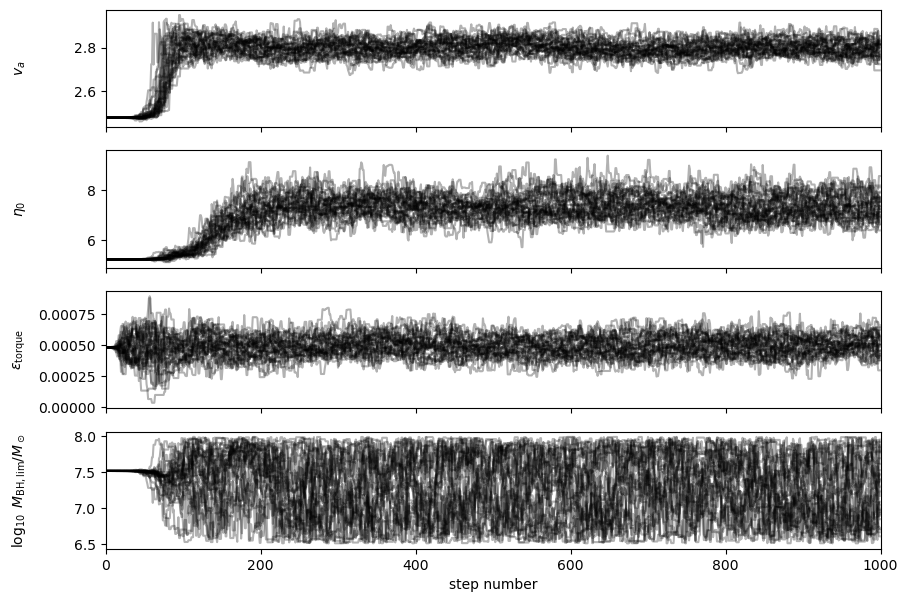

In [80]:
# Plot MCMC chains for each parameter
fig, axes = plt.subplots(ndim, figsize=(10, 7), sharex=True)
samples = sampler.get_chain()
labels = param_printable_names
for i in range(ndim):
    ax = axes[i]
    ax.plot(samples[:, :, i], "k", alpha=0.3)
    ax.set_xlim(0, len(samples))
    ax.set_ylabel(labels[i])
    ax.yaxis.set_label_coords(-0.1, 0.5)

axes[-1].set_xlabel("step number")

In [81]:
acc = sampler.acceptance_fraction
print("Mean acceptance fraction = %s" % np.mean(acc))

Mean acceptance fraction = 0.55165625


In [82]:
# Get autocorrelation time to determine burn-in required
tau = sampler.get_autocorr_time(quiet=True)
print(tau)

The chain is shorter than 50 times the integrated autocorrelation time for 4 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 20;
tau: [62.7958893  92.71355294 34.90322828 42.76493013]


[62.7958893  92.71355294 34.90322828 42.76493013]


In [83]:
# Remove burn-in
nburn = int(np.mean(tau))
print(nburn)
multiplier = 6  # discard first multiplier*nburn steps (will need to change multiplier value so that estimate remains conservative)

# Can also just make burn-in X percent of number of iterations
#x_percent = 0.1
#nburn = x_percent * niter
#multiplier = 1

flat_samples = sampler.get_chain(discard=multiplier*nburn, thin=int(nburn/2), flat=True)

58


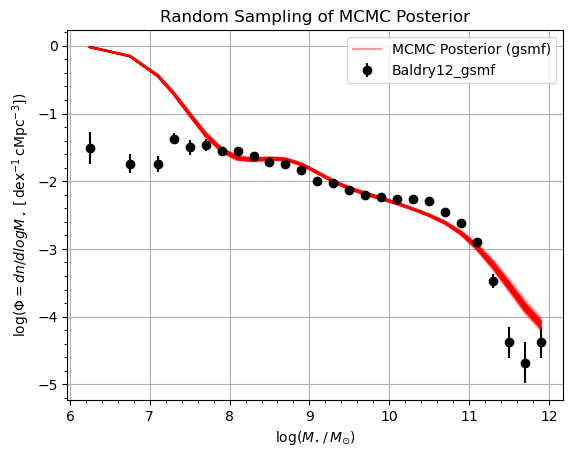

In [89]:
# Extract random sampling of posteriors and plot over data

plt.clf()
#plt.errorbar(data[0], data[1], yerr=data[2], color="black", ls=":", label="KH13")
#plt.errorbar(data_interp[0], data_interp[1], yerr=data_interp[2], color="grey", ls="-", label="%s (Interpolated)" % observable)
plt.errorbar(data_og_full[0], data_og_full[1], yerr=data_og_full[2], color="black", ls="", fmt='o', label=observable)
#plt.errorbar(data_og_full[0], data_og_full[1], yerr=data_og_full[2], color="black", ls="-", label=observable)
#plt.errorbar(data_og_full[0], data_og_full[1], yerr=None, color="black", ls="", fmt='o', label=observable)
#plt.errorbar(data_og_lim[0], data_og_lim[1], yerr=data_og_lim[2], color="black", ls="", fmt='o', label=observable)

for theta in flat_samples[np.random.randint(len(flat_samples), size=100)]:
    pred_x = data[0]
    pred_mcmc = model(theta, x=pred_x)
    plt.plot(pred_x, pred_mcmc, color="r", alpha=0.1)

plt.plot([],[],color="r", alpha=0.4, label='MCMC Posterior (%s)' % obs_name)
    
plt.xlabel(X_LABEL)
plt.ylabel(Y_LABEL)
plt.title('Random Sampling of MCMC Posterior')
plt.grid()
plt.minorticks_on()
plt.legend()
plt.show()

In [90]:
# Posterior parameters with highest probability
theta_max_arr = flat_samples[np.argmax(sampler.get_log_prob(discard=multiplier*nburn, thin=int(nburn/2), flat=True))]
best_fit_model = model(theta_max_arr, x=data[0])

theta_max = {}
for param in emulator.parameter_order:
    idx = emulator.parameter_order.index(param)
    theta_max[param] = theta_max_arr[idx]
    
print ('Theta max: ', theta_max)

Theta max:  {'SIMBAFeedback:FIRE_velocity_normalization': 2.7975483642164756, 'SIMBAFeedback:FIRE_eta_normalization': 7.386952108729983, 'SIMBAAGN:torque_accretion_norm': 0.0004987884889303983, 'SIMBAAGN:jet_mass_min_Msun': 6.614293745029901}


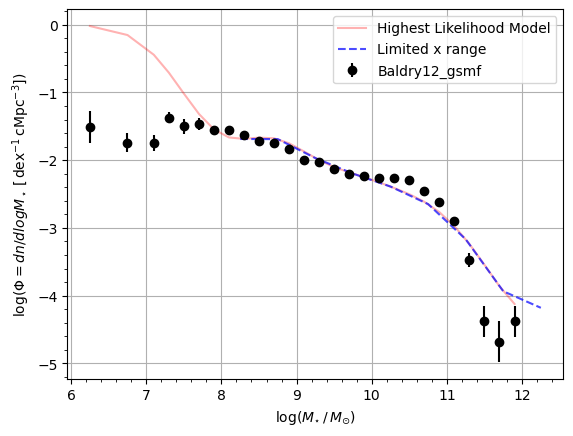

In [93]:
# Plot best-fit model over data

best_fit_model_limited = model(theta_max_arr, x=sim_x)

plt.clf()
#plt.errorbar(data_interp[0], data_interp[1], yerr=data_interp[2], color="grey", ls="-", label="%s (Interpolated)" % observable)
plt.errorbar(data_og_full[0], data_og_full[1], yerr=data_og_full[2], color="black", ls="", fmt='o', label=observable)
#plt.errorbar(data_og_full[0], data_og_full[1], yerr=data_og_full[2], color="black", ls="-", label=observable)
plt.plot(data[0], best_fit_model, color="r", alpha=0.3, label='Highest Likelihood Model')
plt.plot(sim_x, best_fit_model_limited, color="blue", ls='--', alpha=0.7, label='Limited x range')
plt.xlabel(X_LABEL)
plt.ylabel(Y_LABEL)
plt.grid()
plt.minorticks_on()
plt.legend()
plt.show()

Quantiles:
[(0.16, 3.794963797210273), (0.5, 3.9205266052735173), (0.84, 4.077356815897077)]
Quantiles:
[(0.16, 7.4329202521934015), (0.5, 8.237590398639252), (0.84, 9.064077370301144)]
Quantiles:
[(0.16, 6.065869190231097e-05), (0.5, 0.0001968911379628072), (0.84, 0.0004451775780213538)]
Quantiles:
[(0.16, 6.826525360416791), (0.5, 6.989019031579858), (0.84, 7.192746643653425)]


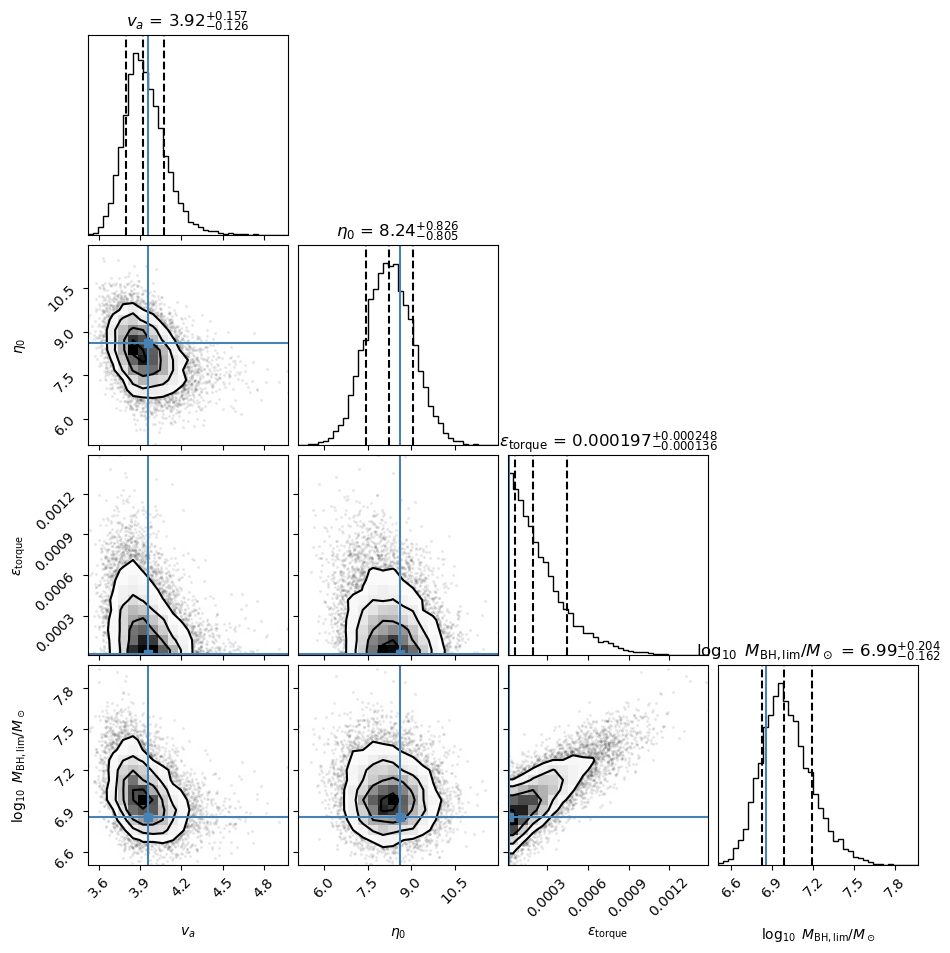

In [268]:
# Corner plot
labels = param_printable_names
fig = corner.corner(flat_samples, bins=20, hist_bin_factor=2, group='posterior', divergences=False, show_titles=True,
                    title_fmt='.3g', labels=labels, plot_datapoints=True, quantiles=[0.16,0.5,0.84],
                    title_quantiles=[0.16,0.5,0.84], smooth=0.2, verbose=True, use_math_text=True, reverse=False, truths=theta_max_arr)